# **Capstone - Collision Severity Analysis**

**Hai Dang Nguyen**  

*This notebook will be used for the Data Science Capstone project.*  
*The project aims to use historical data to explore the actions and the characteristics of where and how collisions happened and to build a reliable model that can predict its severity.*

# **Table of contents**  
**[I. Introduction](#heading--1)**  

**[II. Data](#heading--2)**  

&emsp;**[1. Data Understanding](#heading--2-1)**  
&emsp;&emsp; [Level of collision severity](#heading--2-1-1)  
&emsp;&emsp; [Number of collision over time](#heading--2-1-2)  
&emsp;&emsp; [Location of collision](#heading--2-1-3)  
&emsp;&emsp; [Type of collision](#heading--2-1-4)  
&emsp;&emsp; [Common contributing factors](#heading--2-1-5)   

&emsp;**[2. Data Preparation](#heading--2-2)**  
&emsp;&emsp; [Missing values](#heading--2-2-1)  
&emsp;&emsp; [Unnecessary attributes](#heading--2-2-2)  
&emsp;&emsp; [Feature selection](#heading--2-2-3)  
&emsp;&emsp; [Encoding categorical variables](#heading--2-2-4)  
&emsp;&emsp; [Balancing data](#heading--2-2-5)  
&emsp;&emsp; [Normalizing data](#heading--2-2-6)  
&emsp;&emsp; [Creating the Traing and Testing subsets](#heading--2-2-7)  

**[III. Collision Severity Model](#heading--3)**  
&emsp;**[1. Machine Learning Algorithm Selection](#heading--3-1)**  
&emsp;**[2. Model Development](#heading--3-2)**  
&emsp;&emsp; [K Nearest Neighbor (KNN)](#heading--3-2-1)  
&emsp;&emsp; [Decision Tree](#heading--3-2-2)  
&emsp;&emsp; [Support Vector Machine (SVM)](#heading--3-2-3)  
&emsp;&emsp; [Logistic Regression](#heading--3-2-4)  
&emsp;**[3. Model Evaluation](#heading--3-3)**  

<a id="heading--1"></a>
# **I. Introduction**

<div class="align-justify"> 
    
A traffic collision, or car accident, occurs when a vehicle collides with another vehicle(s), road user(s), animal(s), and object(s) such as road debris, tree, or building. Traffic collisions often result in injuries, disabilities, deaths, and property damages. The other problems are traffic congestion and delay, leading to lost time, a reduction in productivity and an increased response time by police, fire, and emergency medical services. Consequently, the collisions are associated with substantial costs to the economy, the society and the individuals involved. According to the World Health Organization fact sheet in February 2020, every year approximately 1.35 million lives are taken away, and 20 to 50 million more people suffer from non-fatal injuries, with many incurring a disability because of their injury. The collisions cost most countries around 3% of their gross domestic product. Moreover, the number of traffic crashes and their victims has been a rising trend globally due to increases in population and motorization.  

Seattle is the largest city in both the state of Washington and the Pacific Northwest region of North America, with a total population of 3.4 million. In 2018, it was reported that over 80% of Seattle households owned at least one vehicle, which means about 457,000 vehicles crammed into the city’s 84 square miles of land area. In 2019, there were over 11,000 collisions which resulted in around 4,400 injuries, 26 fatalities and numerous property damages. Road safety is thus a major public health issue throughout the world, and it is crucial for many government sectors to work in partnership in order to improve it. The severity is undoubtedly a fundamental aspect of a collision event. Accurate prediction of accident severity and identification of the key factors can provide vital information for an effective management of traffic collisions. This is important to reduce accident frequency and severity in near future, restore the traffic capacity quickly and enhance traffic safety and transportation system efficiency, thus saving many lives and wealth.  

This study aims at developing a model system using machine learning algorithms to predict the collision severity. Indicators for accident severity will be set, which represents number of fatalities, number of injuries, and property damage, respectively.  In addition, it intends to give a good insight into the factors that could be contributing to collisions, for example, crash location, car speeding, weather conditions, lightning condition, and road condition. The severity of future accidents will be based on the similarity of their initial conditions to those of historical collision records..
</div>  

<a id="heading--2"></a>
# **II. Data**  

<div class="align-justify">

The collision data is available City of Seattle Open Data Portal, collected and recorded by the Seattle Department of Transportation’s (SDOT). It includes all types of collisions that happened in Seattle city from 2004 to Sep 2020. This dataset is updated weekly and labelled and contains 221,525 accident records with 40 attributes for each accident as follows:  
    
|<center>**Field**</center>|   <center>Description</center>                                                       |
|:-------------------------|:-------------------------------------------------------------------------------------|  
|**Objectid**              |   ObjectID ESRI unique identifier.                                                   |
|**Inckey**                |   A unique key for the incident.                                                     |
|**Coldetkey**             |	Secondary key for the incident.                                                   |
|**Addrtype**              |	Collision address type.                                                           |
|**Intkey**                |	Key that corresponds to the intersection associated with a collision.             |
|**Location**              |	Description of the general location of the collision.                             |
|**Severitycode**          |	A code that corresponds to the severity of the collision.                         |
|**Collisiontype**         |	Collision type.                                                                   |
|**Personcount**           |	The total number of people involved in the collision.                             |
|**Pedcount**              |	The number of pedestrians involved in the collision. This is entered by the state.|  
|**Pedcylcount**           |	The number of bicycles involved in the collision. This is entered by the state.   |
|**Vehcount**              |	The number of vehicles involved in the collision. This is entered by the state.   |
|**Injuries**              |	The number of total injuries in the collision. This is entered by the state.      |
|**Seriousinjuries**       |	The number of serious injuries in the collision. This is entered by the state.    |
|**Fatalities**            |	The number of fatalities in the collision. This is entered by the state.          |
|**Incdate**               |	The date of the incident.                                                         |
|**Incdttm**               |	The date and time of the incident.                                                |
|**Junctiontype**          |	Category of junction at which collision took place.                               |
|**Sdot_colcode**          |	A code given to the collision by SDOT.                                            |
|**Inattentionind**        |	Whether or not collision was due to inattention. (Y/N)                            |
|**Underinfl**             |	Whether or not a driver involved was under the influence of drugs or alcohol.     | 
|**Weather**               |	A description of the weather conditions during the time of the collision.         |
|**Roadcond**              |	The condition of the road during the collision.                                   |
|**Lightcond**             |	The light conditions during the collision.                                        |
|**Pedrownotgrnt**         |	Whether or not the pedestrian right of way was not granted. (Y/N)                 |
|**Sdotcolnum**            |	A number given to the collision by SDOT.                                          |
|**Speeding**              |	Whether or not speeding was a factor in the collision. (Y/N)                      |
|**St_colcode**            |	A code provided by the state that describes the collision.                        |
|**Seglanekey**            |	A key for the lane segment in which the collision occurred.                       |
|**Crosswalkkey**          |	A key for the crosswalk at which the collision occurred.                          |
|**Hitparkedcar**          |	Whether or not the collision involved hitting a parked car. (Y/N)                 |
  
</div>

##### **Importing the required libraries**

In [1]:
import numpy as np 
import pandas as pd 
import scipy as sp
import seaborn as sns

from pandas.io.json import json_normalize 
from scipy import stats

from sklearn import preprocessing
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Matplotlib and associated plotting modules
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pydotplus
from io import StringIO
import itertools

import requests
import random
import folium
import geopandas as gpd
import pyscreenshot as ImageGrab
import concurrent.futures
import multiprocessing
from folium import plugins
from selenium import webdriver
from shapely.geometry import shape, Point, Polygon
from shapely.ops import nearest_points
from tqdm.auto import tqdm, trange

%matplotlib inline

In [2]:
#!pip install pydotplus geopandas folium pyscreenshot selenium tqdm 
#!conda install -c conda-forge python-graphviz -y

##### **Importing the dataset**

In [3]:
!wget -O Collisions.csv http://data-seattlecitygis.opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0.csv?outSR=%7B%22latestWkid%22%3A2926%2C%22wkid%22%3A2926%7D

--2020-10-18 07:19:14--  http://data-seattlecitygis.opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0.csv?outSR=%7B%22latestWkid%22%3A2926%2C%22wkid%22%3A2926%7D
Resolving data-seattlecitygis.opendata.arcgis.com (data-seattlecitygis.opendata.arcgis.com)... 52.22.243.25, 52.55.102.109, 52.7.217.80, ...
Connecting to data-seattlecitygis.opendata.arcgis.com (data-seattlecitygis.opendata.arcgis.com)|52.22.243.25|:80... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://data-seattlecitygis.opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0.csv?outSR=%7B%22latestWkid%22%3A2926%2C%22wkid%22%3A2926%7D [following]
--2020-10-18 07:19:14--  https://data-seattlecitygis.opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0.csv?outSR=%7B%22latestWkid%22%3A2926%2C%22wkid%22%3A2926%7D
Connecting to data-seattlecitygis.opendata.arcgis.com (data-seattlecitygis.opendata.arcgis.com)|52.22.243.25|:443... connected.
HTTP request se

In [4]:
df = pd.read_csv("Collisions.csv")
df.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (35) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,1.268354e+06,265256.609668,1,1003,1003,3503158,Matched,Block,NaN,AURORA AVE N BETWEEN N 117TH PL AND N 125TH ST,...,Dry,Daylight,Y,NaN,NaN,45,Vehicle - Pedalcyclist,15057,0,N
1,1.259316e+06,202173.388163,2,56200,56200,1795087,Matched,Block,NaN,35TH AVE SW BETWEEN SW MORGAN ST AND SW HOLLY ST,...,Dry,Dark - Street Lights On,NaN,6015003.0,NaN,0,Vehicle going straight hits pedestrian,0,0,N
2,1.264342e+06,259613.000382,3,327037,328537,E979380,Matched,Intersection,37122.0,3RD AVE NW AND NW 100TH ST,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
3,1.279221e+06,222017.872023,4,327278,328778,E996362,Unmatched,Intersection,30602.0,M L KING JR WAY S AND S JACKSON ST,...,NaN,NaN,NaN,NaN,NaN,,NaN,0,0,N
4,1.262205e+06,242179.124204,5,1248,1248,3645424,Unmatched,Block,NaN,W EWING ST BETWEEN 6TH AVE W AND W EWING PL,...,NaN,NaN,NaN,NaN,NaN,,NaN,0,0,N


In [5]:
df.dtypes

X                  float64
Y                  float64
OBJECTID             int64
INCKEY               int64
COLDETKEY            int64
REPORTNO            object
STATUS              object
ADDRTYPE            object
INTKEY             float64
LOCATION            object
EXCEPTRSNCODE       object
EXCEPTRSNDESC       object
SEVERITYCODE        object
SEVERITYDESC        object
COLLISIONTYPE       object
PERSONCOUNT          int64
PEDCOUNT             int64
PEDCYLCOUNT          int64
VEHCOUNT             int64
INJURIES             int64
SERIOUSINJURIES      int64
FATALITIES           int64
INCDATE             object
INCDTTM             object
JUNCTIONTYPE        object
SDOT_COLCODE       float64
SDOT_COLDESC        object
INATTENTIONIND      object
UNDERINFL           object
WEATHER             object
ROADCOND            object
LIGHTCOND           object
PEDROWNOTGRNT       object
SDOTCOLNUM         float64
SPEEDING            object
ST_COLCODE          object
ST_COLDESC          object
S

In [6]:
df.shape

(221525, 40)

<a id="heading--2-1"></a>
## **1. Data Understanding**  
Since we would like to identify the key factors that cause a collision and predict the level of collision severity, we will use SEVERITYCODE as our dependent variable Y, and try different combinations of independent variables X to get the result.

<a id="heading--2-1-1"></a>
### **Level of collision severity**

Column `SEVERITYCODE` encodes the Seattle Department of Transport (SDOT) accident severity metric, according to the following schema:  
**0**: Unknown/no data  
**1**: Property damage only  
**2**: Minor injury collision  
**2b**: Major injury collision  
**3**: Fatality collision  

To get a clearer display of the data, we combine the group 2b of major injury collision into the group 2 of minor injury collision, so that we can compare the three levels of severity which are Property damage, Injury and Fatality. From the pie chart, we can see that approximately two-thirds of the collisions resulted in no apparent injury with around 10% being unknown severity and 62% being property damage. Out of the remaining third, around 28% resulted in some kind of injury even if not severe or fatal, and the number of fatal injury-involved collisions represents a small fraction of the total number of collisions in Seattle (0.2%).

On average, there were 2 people involved in a collision. The number of injuries and fatalities seemed to drop over time, from 6,000 to 4,000 for injuries, from 300 to 170 for serious injuries and from 40 to 20 for fatalities.  However, the percentage of people involved resulting in injuries and fatalities seemed to have no drastic change, with around 17% resulting in injuries, 0.7% resulting in serious injuries and 0.1% resulting in fatalities. In 2015, there was a dramatic collision where the total number of people engaged in a collision peaked at 93, leading to 78 injuries and 5 fatalities. But these numbers have dropped in recent years. Still Seattle City needs effective strategies to be mitigate future collision severity.

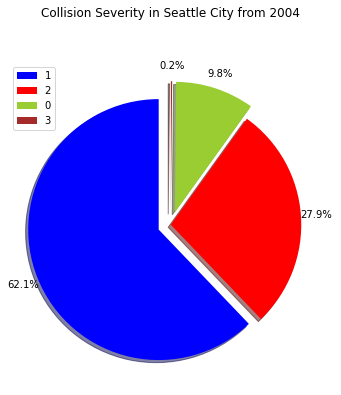

In [7]:
col_level = df.loc[:,['SEVERITYCODE']]
col_level.dropna(inplace = True)
col_level['SEVERITYCODE'].replace('2b', '2', inplace = True)

col_level = col_level['SEVERITYCODE'].value_counts().reset_index()
col_level.columns = ['SEVERITYCODE', 'Count']

colors_list = ['blue', 'red', 'yellowgreen', 'brown']
explode_list = (0.1, 0, 0.1, 0.1)

col_level['Count'].plot (kind = 'pie', figsize = (15, 6), autopct = '%1.1f%%', startangle = 90, shadow = True, labels = None, pctdistance = 1.12, colors = colors_list, explode = explode_list)

plt.title ('Collision Severity in Seattle City from 2004', y = 1.12) 
plt.ylabel(None)
plt.legend (labels = col_level['SEVERITYCODE'], loc = 'upper left') 

plt.show ()

In [8]:
col_count = df.loc[:,['PERSONCOUNT', 'INJURIES', 'SERIOUSINJURIES', 'FATALITIES', 'INCDTTM']]
col_count.dropna(inplace = True)

col_count['INCDTTM']= pd.to_datetime(col_count['INCDTTM'])
col_count['Year'] = col_count['INCDTTM'].dt.year
col_count.drop(col_count[col_count['Year'] == 2003].index, inplace = True) 
del col_count['INCDTTM']

col_count = col_count.groupby('Year')[['PERSONCOUNT','INJURIES', 'SERIOUSINJURIES', 'FATALITIES']].agg(['count', 'sum', 'max'])
col_count['Average person involved'] = col_count.iloc[:, 1]/col_count.iloc[:,0]
col_count['INJURIES percentage'] = (col_count.iloc[:, 4]/col_count.iloc[:,1]).map("{:.2%}".format)
col_count['SERIOUSINJURIES percentage'] = (col_count.iloc[:,7]/col_count.iloc[:,1]).map("{:.2%}".format)
col_count['FATALITIES percentage'] = (col_count.iloc[:,10]/col_count.iloc[:,1]).map("{:.2%}".format)
col_count

PERSONCOUNT            INJURIES           SERIOUSINJURIES           \
           count    sum max    count   sum max           count  sum max   
Year                                                                      
2004       15457  30890  53    15457  5393   7           15457  243   5   
2005       16016  39078  44    16016  6451  11           16016  223   3   
2006       15794  38640  44    15794  6239   9           15794  318   3   
2007       15082  36859  43    15082  5713  13           15082  263   5   
2008       14139  34482  81    14139  5358  11           14139  205   4   
2009       13275  30149  28    13275  4787   7           13275  214   2   
2010       11958  28642  48    11958  4711  11           11958  210   4   
2011       12416  28168  29    12416  4348   7           12416  155   3   
2012       12732  28145  57    12732  4853  10           12732  182   2   
2013       12757  27682  26    12757  4643  12           12757  180   5   
2014       13212  30133  54    13212  4897  15           13212  185   5   
2015       14260  26184  93    14260  5125  78           14260  189  41   
2016       13955  29980  47    13955  5073  10           13955  174   3   
2017       12477  22873  47    12477  4747  11           12477  173   2   
2018       12198  27241  34    12198  4576   7           12198  192   3   
2019       11204  24268  44    11204  4192   6           11204  177   3   
2020        4592   9909  25     4592  1730   6            4592   86   3   

     FATALITIES         Average person involved INJURIES percentage  \
          count sum max                                               
Year                                                                  
2004      15457  30   1                1.998447              17.46%   
2005      16016  30   2                2.439935              16.51%   
2006      15794  42   4                2.446499              16.15%   
2007      15082  14   1                2.443907              15.50%   
2008      14139  20   1                2.438786              15.54%   
2009      13275  24   1                2.271111              15.88%   
2010      11958  20   3                2.395217              16.45%   
2011      12416  11   2                2.268686              15.44%   
2012      12732  22   2                2.210572              17.24%   
2013      12757  24   2                2.169946              16.77%   
2014      13212  18   2                2.280730              16.25%   
2015      14260  21   5                1.836185              19.57%   
2016      13955  24   1                2.148334              16.92%   
2017      12477  21   1                1.833213              20.75%   
2018      12198  14   1                2.233235              16.80%   
2019      11204  26   2                2.166012              17.27%   
2020       4592  14   2                2.157883              17.46%   

     SERIOUSINJURIES percentage FATALITIES percentage  
                                                       
Year                                                   
2004                      0.79%                 0.10%  
2005                      0.57%                 0.08%  
2006                      0.82%                 0.11%  
2007                      0.71%                 0.04%  
2008                      0.59%                 0.06%  
2009                      0.71%                 0.08%  
2010                      0.73%                 0.07%  
2011                      0.55%                 0.04%  
2012                      0.65%                 0.08%  
2013                      0.65%                 0.09%  
2014                      0.61%                 0.06%  
2015                      0.72%                 0.08%  
2016                      0.58%                 0.08%  
2017                      0.76%                 0.09%  
2018                      0.70%                 0.05%  
2019                      0.73%                 0.11%  
2020               

<a id="heading--2-1-2"></a>
### **Number of collisions over time**

Since 2004, the number of collisions in Seattle has remained at a high level, around 11,000 annually and peaked at 16,000 collisions in 2005. It declined steadily from 2006 to 2013, only to rebound slightly in the four subsequent years but remained well below the 2005 numbers. In the recent years from 2015, the number of collisions has decreased again, but the incident scale has no significant change in this period. In 2020  during the COVID-19 outbreak, on top of the closure of all nonessential businesses and schools until April, residents are being urged and pleaded with to stay home. And with that, there has been less congestion and traffic, hence resulting in a large reduction in accidents compared to 2019. The number of injury-involved collisions stayed roughly constant while the amount of unknown severity data increased from 2008, leading to a drop on property damage-involved collisions. Combining with the insight above about the level of collision severity, this suggests an enhancement in data recording regarding the severity. 

With similar approach for monthly data, October was the worst month with more car accidents than the average month, in contrast to February with fewer accidents than the average month. In a week, the number of collisions grew through the working week, peaking on Friday. Sunday was the quietest day, with much fewer collisions than the average day. However, fatalities peaked on the weekends with Saturday having more deaths than the average day. In addition, there seemed to be more collision occurring during the morning rush between 8am and 9am, during lunch time between 11am and 12pm, but most during the evening jam from 2pm to 6pm experiencing 40% of the day's collisions. 

In [9]:
col_number = df.loc[:,['SEVERITYCODE','INCDTTM']]
col_number.dropna(inplace = True)
col_number['INCDTTM']= pd.to_datetime(col_number['INCDTTM'])
col_number['Year'] = col_number['INCDTTM'].dt.year
col_number['Month'] = col_number['INCDTTM'].dt.month
col_number['Day'] = col_number['INCDTTM'].dt.day_name()
col_number.drop(col_number[col_number['Year'] == 2003].index, inplace = True) 
col_number['SEVERITYCODE'].replace('2b', '2', inplace = True)

Text(0.5, 0, 'Day of Week')

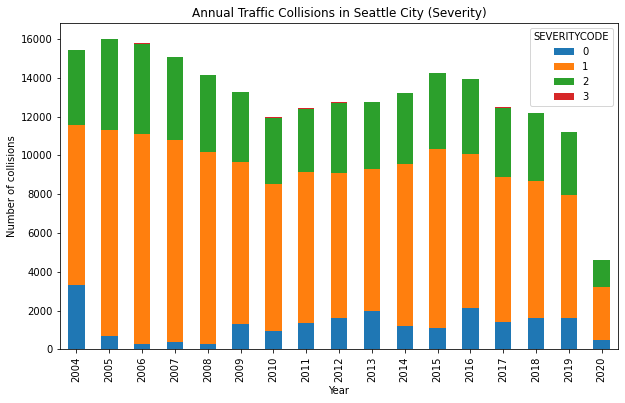

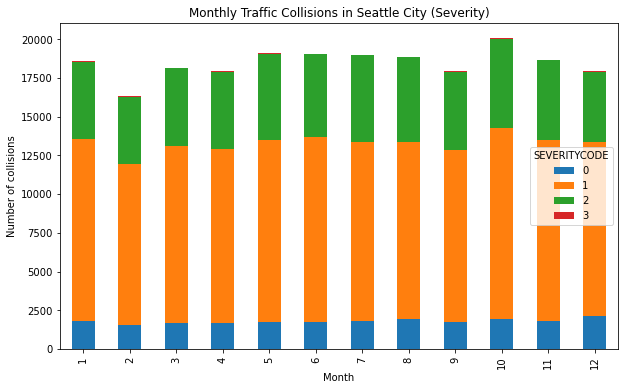

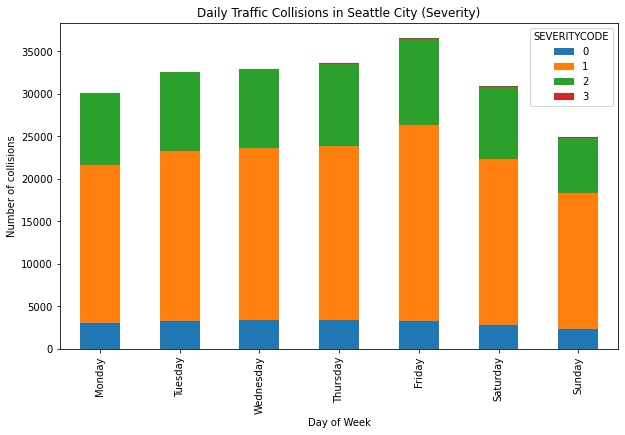

In [10]:
col_year = col_number.loc[:,['Year', 'SEVERITYCODE']]
col_year = col_year.groupby(['Year', 'SEVERITYCODE']).size().reset_index()
col_year.columns = ['Year','SEVERITYCODE','Count']
col_year = col_year.pivot('Year', 'SEVERITYCODE', 'Count')

ax1 = col_year.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax1.set_title ('Annual Traffic Collisions in Seattle City (Severity)')
ax1.set_ylabel ('Number of collisions')
ax1.set_xlabel ('Year')

col_month = col_number.loc[:,['Month', 'SEVERITYCODE']]
col_month = col_month.groupby(['Month', 'SEVERITYCODE']).size().reset_index()
col_month.columns = ['Month','SEVERITYCODE','Count']
col_month = col_month.pivot('Month', 'SEVERITYCODE', 'Count')

ax2 = col_month.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax2.set_title ('Monthly Traffic Collisions in Seattle City (Severity)')
ax2.set_ylabel ('Number of collisions')
ax2.set_xlabel ('Month')

col_day = col_number.loc[:,['Day', 'SEVERITYCODE']]
col_day = col_day.groupby(['Day', 'SEVERITYCODE']).size().reset_index()
col_day.columns = ['Day','SEVERITYCODE','Count']
col_day['Day'] = pd.Categorical(col_day['Day'], categories = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'], ordered = True)
col_day = col_day.sort_values('Day')
col_day = col_day.pivot('Day', 'SEVERITYCODE', 'Count')

ax3 = col_day.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax3.set_title ('Daily Traffic Collisions in Seattle City (Severity)')
ax3.set_ylabel ('Number of collisions')
ax3.set_xlabel ('Day of Week')

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator


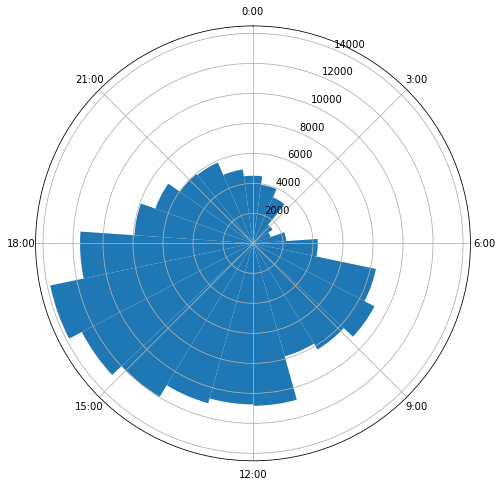

In [11]:
col_time = col_number['INCDTTM'].dt.hour+col_number['INCDTTM'].dt.minute/60+col_number['INCDTTM'].dt.second/3600
col_time = col_time[col_time > 0]

N = 23
bottom = 2

# create theta for 24 hours
theta = np.linspace(0.0, 2 * np.pi, N, endpoint = False)

# make the histogram that bined on 24 hour
radii, tick = np.histogram (col_time, bins = 23)

# width of each bin on the plot
width = (2 * np.pi) / N

# make a polar plot
plt.figure(figsize = (12, 8))
ax4 = plt.subplot(111, polar = True)
bars = ax4.bar(theta, radii, width = width, bottom = bottom)

# set the lable go clockwise and start from the top
ax4.set_theta_zero_location("N")
# clockwise
ax4.set_theta_direction(-1)

# set the label
ticks = ['0:00', '3:00', '6:00', '9:00', '12:00', '15:00', '18:00', '21:00']
ax4.set_xticklabels(ticks)

plt.show()

<a id="heading--2-1-3"></a>
### **Location of Collision**
By using the columns `X` and `Y` which are the coordinates of the collisions, a Folium map reveals that accidents occur more frequently towards the centre of the city, and in neighbourhoods at either end of road bridges which straddle Seattle’s major waterways. For instance, James Street and Sixth Avenue, Boren Avenue and Pike Street, Lake City Way NE and NE 130th Street, and Dexter Avenue North and Thomas Street have continuously topped the list of Seattle’s the most dangerous intersections. The West Seattle Bridge, the East Marginal Way South, the Ballard Bridge, the Montlake Bridge, the Fremont Bridge, 1st Ave S Bridge, and S Michigan St made the list for the busiest arterials and reported a higher incidence of accidents than average. The corresponding higher pedestrian volumes and/or higher vehicle volumes would increase the opportunities for pedestrian-vehicle and vehicle-vehicle conflicts.

It seemed that collision occurred mostly in the mid-block of a segment (around 60% of total collision), with majority not related to an intersection (around 50%). But many collisions also took place at an intersection (33% of total collision), which is not surprising given intersections have the highest potential for conflicts—they have more users interacting and more movements. Around 5.5% of total collision was at the driveway junctions. And perhaps crashes were more likely to be severe at locations without a traffic signal. 

In [12]:
#!wget -O Collisions.geojson http://data-seattlecitygis.opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0.geojson?outSR=%7B%22latestWkid%22%3A2926%2C%22wkid%22%3A2926%7D
map_df = pd.DataFrame(gpd.read_file('Collisions.geojson')[['SEVERITYCODE','geometry']])
map_df.dropna(inplace = True)
map_df.head()

,SEVERITYCODE,geometry
0,1,POINT (-122.35651 47.51736)
1,1,POINT (-122.36140 47.70206)
2,2,POINT (-122.31741 47.66403)
3,2,POINT (-122.31823 47.61993)
4,2,POINT (-122.35172 47.56031)


In [13]:
#!wget https://raw.githubusercontent.com/seattleio/seattle-boundaries-data/master/data/neighborhoods.geojson
geodata = pd.DataFrame(gpd.read_file('neighborhoods.geojson')[['geometry', 'name']])
geodata.head()

,geometry,name
0,"POLYGON ((-122.37633 47.67594, -122.37669 47.6...",Loyal Heights
1,"POLYGON ((-122.37633 47.67594, -122.37621 47.6...",Adams
2,"POLYGON ((-122.37633 47.67594, -122.37657 47.6...",Whittier Heights
3,"POLYGON ((-122.37633 47.67594, -122.37610 47.6...",West Woodland
4,"POLYGON ((-122.40211 47.69766, -122.40199 47.6...",Sunset Hill


In [14]:
def distance(point):
    result = [geom.distance(point) for geom in geodata['geometry']]
    min_dist_index = pd.Series(result).idxmin()
    nhood = geodata['name'].iloc[min_dist_index]
    return nhood

map_df['Neighborhood'] = map_df.apply(lambda x: distance(x['geometry']), axis = 1)
map_df.head()

,SEVERITYCODE,geometry,Neighborhood
0,1,POINT (-122.35651 47.51736),South Delridge
1,1,POINT (-122.36140 47.70206),Greenwood
2,2,POINT (-122.31741 47.66403),University District
3,2,POINT (-122.31823 47.61993),Broadway
4,2,POINT (-122.35172 47.56031),Industrial District


In [15]:
# Clean the dataset map_df
map_df.drop(map_df[map_df['SEVERITYCODE'] == '0'].index, inplace = True) 
map_df['SEVERITYCODE'].replace('2b', '2', inplace = True)
map_df['SEVERITYCODE'].replace(to_replace = ['1', '2', '3'], value = [1, 2, 3], inplace = True)

In [69]:
# Count the number of accidents in each neighbourhood
accidents_per_nhood = pd.DataFrame(map_df['Neighborhood'].value_counts())
accidents_per_nhood.reset_index(inplace = True)
accidents_per_nhood.rename(columns = {'Neighborhood':'Count'}, inplace = True)
accidents_per_nhood.rename(columns = {'index':'Neighborhood'}, inplace = True)

# Calculate the average severity of accidents in each neighbourhood 
avg_severity_nhood = map_df.groupby('Neighborhood', as_index = False)['SEVERITYCODE'].mean()
accidents_per_nhood["Mean_Severity"] = accidents_per_nhood['Neighborhood'].map(avg_severity_nhood.set_index('Neighborhood')['SEVERITYCODE'])

# Sort the data by the number of accidents
accidents_per_nhood.sort_values(by = ['Count'], ascending = False)
accidents_per_nhood.head(10)

,Neighborhood,Count,Mean_Severity
0,Belltown,9024,1.286348
1,Industrial District,8919,1.330530
2,University District,7811,1.298809
3,Central Business District,7487,1.309203
4,Broadway,7281,1.279907
5,Columbia City,5618,1.330367
6,Greenwood,5045,1.349653
7,South Lake Union,4773,1.309030
8,North Beacon Hill,4650,1.316344
9,Wallingford,4406,1.304585


In [17]:
# Generate choropleth map using the number of accidents
# Create numpy array of length 6 with linear spacing from minium value to maximum value
threshold_scale = np.linspace(accidents_per_nhood['Count'].min(), accidents_per_nhood['Count'].max(), 6, dtype = int)
threshold_scale = threshold_scale.tolist() 
threshold_scale[-1] = threshold_scale[-1] + 1 #ensure the last value of list > maximum value

# Generate choropleth map 
seattle_map = folium.Map(location = [47.620422, -122.349358], zoom_start = 12)
seattle_map.choropleth(geo_data = r'neighborhoods.geojson', data = accidents_per_nhood, columns = ['Neighborhood', 'Count'],
                       key_on = 'feature.properties.name', threshold_scale = threshold_scale,
                       fill_color = 'YlOrRd', fill_opacity = 0.7, line_opacity = 0.2,
                       legend_name = 'No. of accidents per neighbourhood in Seattle City from 2004',
                       reset = True)

seattle_map

In [18]:
# Generate Average accident severity map
# Create numpy array of length 6 with linear spacing from minium value to maximum value
threshold_scale = np.linspace(accidents_per_nhood['Mean_Severity'].min(), accidents_per_nhood['Mean_Severity'].max(), 6, dtype = float)
threshold_scale = threshold_scale.tolist() 
threshold_scale[-1] = threshold_scale[-1] + 1 

#Generate a choropleth map of the mean accident severity in each neighbourhood
seattle_map = folium.Map(location = [47.620422, -122.349358], zoom_start = 12)
seattle_map.choropleth(geo_data = r'neighborhoods.geojson', data = accidents_per_nhood, columns = ['Neighborhood', 'Mean_Severity'],
                       key_on = 'feature.properties.name', threshold_scale = threshold_scale,
                       fill_color = 'YlOrRd', fill_opacity = 0.7, line_opacity = 0.2,
                       legend_name = 'Average accident severity per neighbourhood in Seattle City from 2004',
                       reset = True)

seattle_map

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  del sys.path[0]


[Text(0, 0.0, '0%'),
 Text(0, 0.1, '10%'),
 Text(0, 0.2, '20%'),
 Text(0, 0.30000000000000004, '30%'),
 Text(0, 0.4, '40%'),
 Text(0, 0.5, '50%'),
 Text(0, 0.6000000000000001, '60%')]

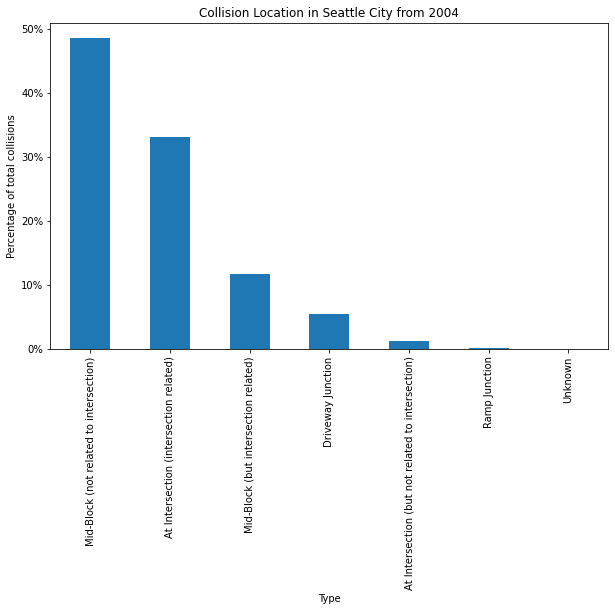

In [19]:
col_loc= df.loc[:,['JUNCTIONTYPE']]
col_loc.dropna(inplace = True)
col_location = col_loc['JUNCTIONTYPE'].value_counts().reset_index()
col_location.columns = ['JUNCTIONTYPE', 'Count']
col_location = col_location.set_index('JUNCTIONTYPE')
col_location = col_location.div(col_loc['JUNCTIONTYPE'].shape[0], axis = 0)
col_location.reset_index()

ax5 = col_location.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True, legend = None)
ax5.set_title ('Collision Location in Seattle City from 2004')
ax5.set_ylabel ('Percentage of total collisions')
ax5.set_xlabel ('Type')
ax5.set_yticklabels(['{:,.0%}'.format(x) for x in ax5.get_yticks()])

<a id="heading--2-1-4"></a>
### **Type of Collision**

Perhaps surprisingly, the most common type of collision was collisions between a moving vehicle and a parked vehicle (around 25% of total collision). The following most common collisions were vehicles entering the flow of traffic at an angle (typically at intersections) and vehicles traveling in the same direction (the vast majority of which were likely rear-end collisions), each contributed around 20% of total collision in Seattle. Other common types of collisions are sideswipes, left turns, and right turns. Only 1% resulted in head-on collisions where the drivers might cross into another lane of traffic or go the wrong way on an exit ramp or street. There were some other types such as broadside collisions, vehicles hitting fixed objects (6% of total collisions involved hitting a parked car), etc., and they are grouped as 'Other' and accounted for 12% of total collisions.

The bicyclists and pedestrians were involved in only 7% of all crashes, while around 90% involved at least one vehicle. Around 4% were pedestrian-vehicle collision and approximately 3% were bicyclist-vehicle collision. There were several cases where multiple people and vehicles are involved, nearly 8% of total collisions involved more than 2 vehicles. The maximum number of engagements in a collision was 6 for pedestrians, 2 for bicyclists and 15 for vehicles. 

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  del sys.path[0]


[Text(0, 0.0, '0%'),
 Text(0, 0.05, '5%'),
 Text(0, 0.1, '10%'),
 Text(0, 0.15000000000000002, '15%'),
 Text(0, 0.2, '20%'),
 Text(0, 0.25, '25%'),
 Text(0, 0.30000000000000004, '30%')]

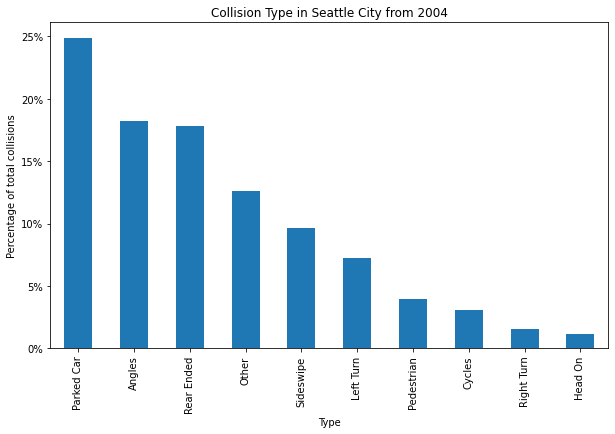

In [20]:
col_typ = df.loc[:,['COLLISIONTYPE']]
col_typ.dropna(inplace = True)
col_type = col_typ['COLLISIONTYPE'].value_counts().reset_index()
col_type.columns = ['COLLISIONTYPE', 'Count']
col_type = col_type.set_index('COLLISIONTYPE')
col_type = col_type.div(col_typ['COLLISIONTYPE'].shape[0], axis = 0)
col_type.reset_index()

ax6 = col_type.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True, legend = None)
ax6.set_title ('Collision Type in Seattle City from 2004')
ax6.set_ylabel ('Percentage of total collisions')
ax6.set_xlabel ('Type')
ax6.set_yticklabels(['{:,.0%}'.format(x) for x in ax6.get_yticks()])

In [21]:
col_inv = df.loc[:,['PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT']]
col_inv.dropna(inplace = True)
col_inv['PEDCOUNT'][col_inv['PEDCOUNT'] > 1] = 'Multiple involved'
col_inv['PEDCOUNT'][col_inv['PEDCOUNT'] == 1] = 'Involved'
col_inv['PEDCOUNT'][col_inv['PEDCOUNT'] == 0] = 'Not involved'
col_inv['PEDCYLCOUNT'][col_inv['PEDCYLCOUNT'] > 1] = 'Multiple involved'
col_inv['PEDCYLCOUNT'][col_inv['PEDCYLCOUNT'] == 1] = 'Involved'
col_inv['PEDCYLCOUNT'][col_inv['PEDCYLCOUNT'] == 0] = 'Not involved'
col_inv['VEHCOUNT'][col_inv['VEHCOUNT'] > 2] = 'Multiple involved'
col_inv['VEHCOUNT'][col_inv['VEHCOUNT'] == 2] = 'Involved'
col_inv['VEHCOUNT'][col_inv['VEHCOUNT'] == 1] = 'Involved'
col_inv['VEHCOUNT'][col_inv['VEHCOUNT'] == 0] = 'Not involved'

col_involved = pd.DataFrame({'Status':col_inv['PEDCOUNT'].unique()})
col_involved['PEDCOUNT'] = col_involved['Status'].map(col_inv['PEDCOUNT'].value_counts())
col_involved['PEDCYLCOUNT'] = col_involved['Status'].map(col_inv['PEDCYLCOUNT'].value_counts())
col_involved['VEHCOUNT'] = col_involved['Status'].map(col_inv['VEHCOUNT'].value_counts())
col_involved.set_index('Status', inplace=True)
col_involved = col_involved.div(col_inv['PEDCOUNT'].shape[0], axis = 0)
col_involved['PEDCOUNT'] = col_involved['PEDCOUNT'].map("{:.2%}".format)
col_involved['PEDCYLCOUNT'] = col_involved['PEDCYLCOUNT'].map("{:.2%}".format)
col_involved['VEHCOUNT'] = col_involved['VEHCOUNT'].map("{:.2%}".format)

col_involved

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT
Status,,,
Not involved,96.36%,97.29%,11.98%
Involved,3.50%,2.69%,80.48%
Multiple involved,0.14%,0.02%,7.54%


In [22]:
col_inv3 = df.loc[:,['PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT']]
col_inv3.describe()

,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT
count,221525.000000,221525.000000,221525.000000
mean,0.038118,0.027360,1.730482
std,0.201766,0.164537,0.829754
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,2.000000
50%,0.000000,0.000000,2.000000
75%,0.000000,0.000000,2.000000
max,6.000000,2.000000,15.000000


In [23]:
col_inv2 = df.loc[:,['PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT']]
col_inv2.dropna(inplace = True)
col_inv2 [col_inv2 >= 1] = 'Involved'
col_inv2 [col_inv2 == 0] = 'Not involved'

col_involved2 = col_inv2.groupby(['PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT']).size().reset_index()
col_involved2.columns = ['PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'Count']
col_involved2['Percentage'] = col_involved2['Count'].div(col_inv2.shape[0], axis = 0)
col_involved2['Percentage'] = col_involved2['Percentage'].map("{:.2%}".format)

col_involved2

,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,Count,Percentage
0,Involved,Involved,Involved,13,0.01%
1,Involved,Involved,Not involved,98,0.04%
2,Involved,Not involved,Involved,7962,3.59%
3,Not involved,Involved,Involved,5753,2.60%
4,Not involved,Involved,Not involved,146,0.07%
5,Not involved,Not involved,Involved,181260,81.82%
6,Not involved,Not involved,Not involved,26293,11.87%


In [24]:
col_parked = df.loc[:,['HITPARKEDCAR']]
col_parked.dropna(inplace = True)

col_parkedcar = col_parked.groupby(['HITPARKEDCAR']).size().reset_index()
col_parkedcar.columns = ['HITPARKEDCAR', 'Count']
col_parkedcar['Percentage'] = col_parkedcar['Count'].div(col_parked.shape[0], axis = 0)
col_parkedcar['Percentage'] = col_parkedcar['Percentage'].map("{:.2%}".format)

col_parkedcar

,HITPARKEDCAR,Count,Percentage
0,N,209492,94.57%
1,Y,12033,5.43%


<a id="heading--2-1-5"></a>
### **Common Contributing Factors**

Car accidents happen for a host of reasons, including behavioral, environmental, and situational. A small number of car accidents are inevitable and cannot be prevented. Most of them, however, could at least be prevented, and many result from poor decisions by drivers who should have done better. The most common causes of car accidents are: 

1. **Driver distraction**: distracted driving is a prevalent risky behavior and hence a leading contributing cause of collisions in Seattle. Many circumstances are considered inattention like eating, grooming, using mobile phone, adjusting an audio system, other distractions inside the vehicle and distractions outside the vehicle. Every year around 1,000 to more than 2,000 cases were distraction-involved and the number has been increasing after 2011. This accounted for around 20% of total collisions starting from 2013. In 2020, luckily there has been no such case occurring yet.  

2. **Alcohol and drug impairment**: Driver impairment due to alcohol and/or drugs is one of the most contributing factors in fatal crashes and is involved in over 600 collisions per year, and this number has just slightly reduced over time without oblivious improvement. The dataset entries had a complete change starting 2012, switching from 0 - 1 to N - Y.  

3. **Speeding**: Speeding remains a significant cause of car accidents in Seattle, noted as a contributing factor in over 400 collisions each year under the categories “exceeding reasonable and safe speed” and “exceeding the speed limit”. Conditions for pedestrians and bikers being hit by a vehicle also deteriorate with speed. But with continually improving road safety strategies, this number reduced from 900 collisions annually during the peak period 2005-2008.   

4. **Whether the pedestrian right of way was not granted**: This is a commonly cited factor for pedestrian and bicyclist-involved collisions in Seattle, causing over 200 cases annually but this number has decreased in recent years. This contributing factor generally indicates that a driver, pedestrian, or bicyclists stopped a fellow traveler from continuing their legal path. Examples of a “did not grant right-of-way” collision are unsafe crossing practices (such as crossing against a signal or failing to use a crosswalk), and disregarding traffic signals or stop signs.   

5. **Weather**: Weather acts through visibility impairments, slick pavement, high winds, and temperature extremes to affect driver capabilities and vehicle performance, leading to crash risk. Surprisingly, over 60% of total collisions occurred in a clear weather, whereas the vast majority of most weather-related crashes happened during rainfall and overcast weather, around 20% of all crashes respectively.  A much smaller percentage of weather-related crashes occur during high winds blowing sand/dirt. The remaining cases took place in the presence of fog and snow, on icy pavement or under severe crosswinds.  

6. **Light conditions**:  Poor lighting conditions can limit the ability of a road user to see other users or road signals. In Seattle, again surprisingly, over 60% of the accidents occurred during daylight hours. Over 30% of these collisions occurred when it was dark out but there were streetlights on. There were still over 100 cases each year that were caused by the unavailability of streetlights. The remainder of the collisions occurred at dawn, dusk, or there was no record about the light conditions.   

7. **Road conditions**: Drivers have an obligation to operate their vehicles in a manner appropriate for road conditions, but that is not always an easy task. Wet roads, in particular, contributed to nearly 30% of Seattle car accidents. The fact that over 60% of the accidents occurred with dry roads, combining with the weather and light conditions data, means that these collisions were due to human-related factors. The remainder of the collisions occurred with poor road conditions such as ice and snow not properly cleared, standing water, oil built up on the roads, and more. 

In [25]:
col_factors = df.loc[:,['SEVERITYCODE', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'PEDROWNOTGRNT', 'SPEEDING', 'HITPARKEDCAR', 'INCDTTM']]
col_factors['INATTENTIONIND'].replace(np.nan, 'N', inplace = True)
col_factors['PEDROWNOTGRNT'].replace(np.nan, 'N', inplace = True)
col_factors['SPEEDING'].replace(np.nan, 'N', inplace = True)
col_factors['SEVERITYCODE'].replace('2b', '2', inplace = True)
col_factors.dropna(inplace = True)

col_factors['INCDTTM']= pd.to_datetime(col_factors['INCDTTM'])
col_factors['Year'] = col_factors['INCDTTM'].dt.year
col_factors.drop(col_factors[col_factors['Year'] == 2003].index, inplace = True) 
del col_factors['INCDTTM']

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  # This is added back by InteractiveShellApp.init_path()
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:47: UserWarning: FixedFormatter should only be used together with FixedLocator


[Text(0, 0.0, '0%'),
 Text(0, 0.2, '20%'),
 Text(0, 0.4, '40%'),
 Text(0, 0.6000000000000001, '60%'),
 Text(0, 0.8, '80%'),
 Text(0, 1.0, '100%'),
 Text(0, 1.2000000000000002, '120%')]

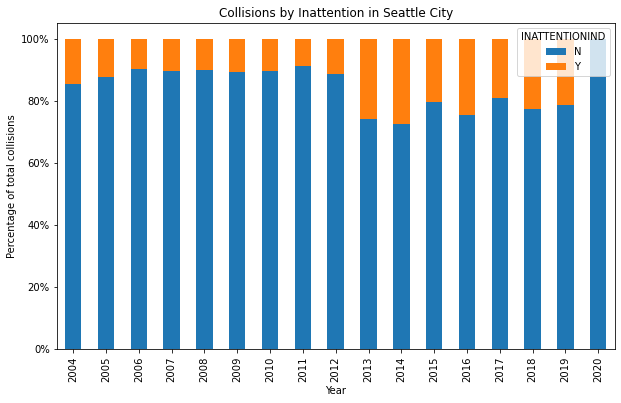

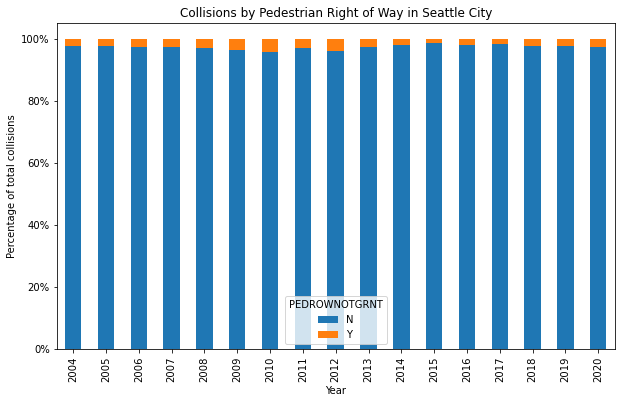

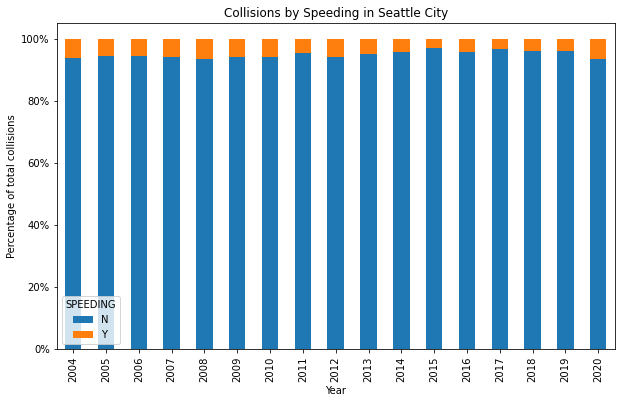

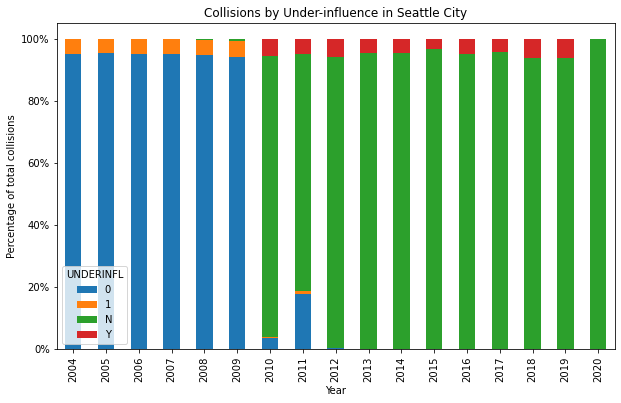

In [26]:
col_inattendtion = col_factors.loc[:,['Year', 'INATTENTIONIND']]
col_inattendtion = col_inattendtion.groupby(['Year','INATTENTIONIND']).size().reset_index()
col_inattendtion.columns = ['Year', 'INATTENTIONIND', 'Count']
col_inattendtion['Percentage'] = col_inattendtion['Count'].div(col_inattendtion['Year'].map(col_factors['Year'].value_counts()), axis = 0)
col_inattendtion = col_inattendtion.pivot('Year', 'INATTENTIONIND', 'Percentage')

ax7 = col_inattendtion.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax7.set_title ('Collisions by Inattention in Seattle City')
ax7.set_ylabel ('Percentage of total collisions')
ax7.set_xlabel ('Year')
ax7.set_yticklabels(['{:,.0%}'.format(x) for x in ax7.get_yticks()])

col_pedest = col_factors.loc[:,['Year', 'PEDROWNOTGRNT']]
col_pedest = col_pedest.groupby(['Year','PEDROWNOTGRNT']).size().reset_index()
col_pedest.columns = ['Year', 'PEDROWNOTGRNT', 'Count']
col_pedest['Percentage'] = col_pedest['Count'].div(col_pedest['Year'].map(col_factors['Year'].value_counts()), axis = 0)
col_pedest = col_pedest.pivot('Year', 'PEDROWNOTGRNT', 'Percentage')

ax8 = col_pedest.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax8.set_title ('Collisions by Pedestrian Right of Way in Seattle City')
ax8.set_ylabel ('Percentage of total collisions')
ax8.set_xlabel ('Year')
ax8.set_yticklabels(['{:,.0%}'.format(x) for x in ax8.get_yticks()])

col_speed = col_factors.loc[:,['Year', 'SPEEDING']]
col_speed = col_speed.groupby(['Year','SPEEDING']).size().reset_index()
col_speed.columns = ['Year', 'SPEEDING', 'Count']
col_speed['Percentage'] = col_speed['Count'].div(col_speed['Year'].map(col_factors['Year'].value_counts()), axis = 0)
col_speed = col_speed.pivot('Year', 'SPEEDING', 'Percentage')

ax9 = col_speed.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax9.set_title ('Collisions by Speeding in Seattle City')
ax9.set_ylabel ('Percentage of total collisions')
ax9.set_xlabel ('Year')
ax9.set_yticklabels(['{:,.0%}'.format(x) for x in ax9.get_yticks()])

col_influence = col_factors.loc[:,['Year', 'UNDERINFL']]
col_influence = col_influence.groupby(['Year', 'UNDERINFL']).size().reset_index()
col_influence.columns = ['Year', 'UNDERINFL', 'Count']
col_influence['Percentage'] = col_influence['Count'].div(col_influence['Year'].map(col_factors['Year'].value_counts()), axis = 0)
col_influence = col_influence.pivot('Year', 'UNDERINFL', 'Percentage')

ax10 = col_influence.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax10.set_title ('Collisions by Under-influence in Seattle City')
ax10.set_ylabel ('Percentage of total collisions')
ax10.set_xlabel ('Year')
ax10.set_yticklabels(['{:,.0%}'.format(x) for x in ax10.get_yticks()])

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  # This is added back by InteractiveShellApp.init_path()
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator


[Text(0, 0.0, '0%'),
 Text(0, 0.2, '20%'),
 Text(0, 0.4, '40%'),
 Text(0, 0.6000000000000001, '60%'),
 Text(0, 0.8, '80%'),
 Text(0, 1.0, '100%'),
 Text(0, 1.2000000000000002, '120%')]

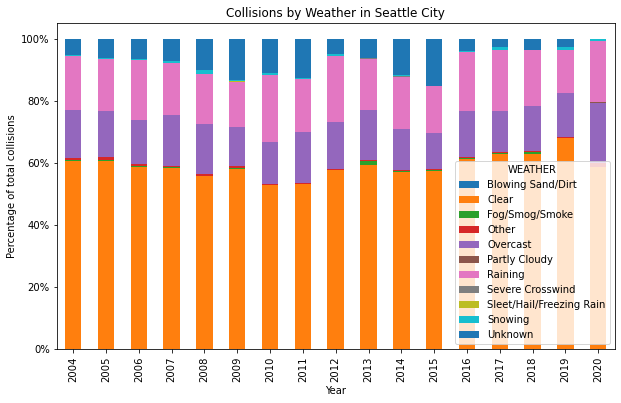

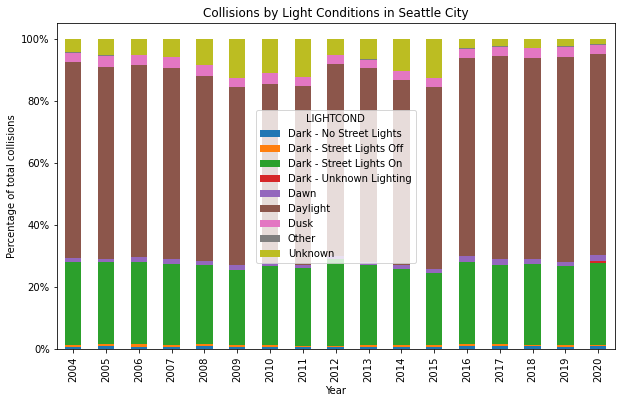

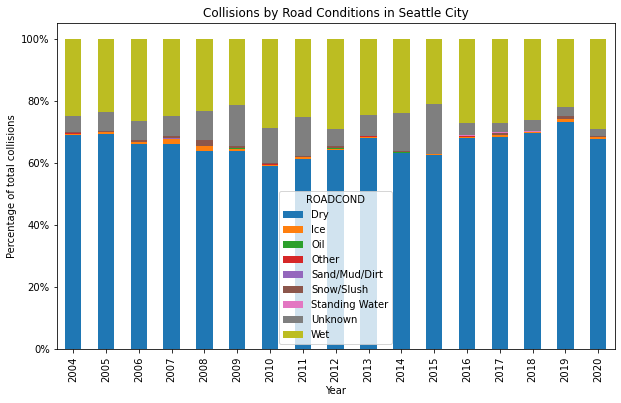

In [27]:
col_weather = col_factors.loc[:,['Year', 'WEATHER']]
col_weather = col_weather.groupby(['Year', 'WEATHER']).size().reset_index()
col_weather.columns = ['Year', 'WEATHER', 'Count']
col_weather['Percentage'] = col_weather['Count'].div(col_weather['Year'].map(col_factors['Year'].value_counts()), axis = 0)
col_weather = col_weather.pivot('Year', 'WEATHER', 'Percentage')

ax11 = col_weather.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax11.set_title ('Collisions by Weather in Seattle City')
ax11.set_ylabel ('Percentage of total collisions')
ax11.set_xlabel ('Year')
ax11.set_yticklabels(['{:,.0%}'.format(x) for x in ax11.get_yticks()])

col_light = col_factors.loc[:,['Year', 'LIGHTCOND']]
col_light = col_light.groupby(['Year', 'LIGHTCOND']).size().reset_index()
col_light.columns = ['Year', 'LIGHTCOND', 'Count']
col_light['Percentage'] = col_light['Count'].div(col_light['Year'].map(col_factors['Year'].value_counts()), axis = 0)
col_light = col_light.pivot('Year', 'LIGHTCOND', 'Percentage')

ax12 = col_light.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax12.set_title ('Collisions by Light Conditions in Seattle City')
ax12.set_ylabel ('Percentage of total collisions')
ax12.set_xlabel ('Year')
ax12.set_yticklabels(['{:,.0%}'.format(x) for x in ax11.get_yticks()])

col_road = col_factors.loc[:,['Year', 'ROADCOND']]
col_road = col_road.groupby(['Year', 'ROADCOND']).size().reset_index()
col_road.columns = ['Year', 'ROADCOND', 'Count']
col_road['Percentage'] = col_road['Count'].div(col_road['Year'].map(col_factors['Year'].value_counts()), axis = 0)
col_road = col_road.pivot('Year', 'ROADCOND', 'Percentage')

ax13 = col_road.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax13.set_title ('Collisions by Road Conditions in Seattle City')
ax13.set_ylabel ('Percentage of total collisions')
ax13.set_xlabel ('Year')
ax13.set_yticklabels(['{:,.0%}'.format(x) for x in ax11.get_yticks()])

<a id="heading--2-2"></a>
## **2. Data Preparation**

In their original form, the Seattle collision data is not suitable for quantitative data analysis and so likely to create noise in the modeling result. The main reasons for this are as follows:

<a id="heading--2-2-1"></a>
### **Missing Values**  
There are missing values on part of the database, around 10% of the target variable `SEVERITYCODE` is unknown and some attributes have over 40% of missing data (such as `INTKEY`, `EXCEPTRSNCODE`). Common attributing factors (such as `JUNCTIONTYPE`, `WEATHER`, `LIGHTCOND`, `ROADCOND`) include unknown entries which have same meaning as missing data.

In [28]:
df['SEVERITYCODE'].value_counts(normalize = True)

1     0.621472
2     0.265357
0     0.097574
2b    0.014017
3     0.001580
Name: SEVERITYCODE, dtype: float64

In [29]:
Total_collisions = df.shape[0]
missing_values=df.isnull().sum(axis=0).to_frame('NaN Count')
missing_values['NaN Percentage'] = missing_values['NaN Count']/Total_collisions
missing_values.style.format({'NaN Count': '{:,.0f}'.format,'NaN Percentage': '{:,.1%}'.format})

,NaN Count,NaN Percentage
X,"7,475",3.4%
Y,"7,475",3.4%
OBJECTID,0,0.0%
INCKEY,0,0.0%
COLDETKEY,0,0.0%
REPORTNO,0,0.0%
STATUS,0,0.0%
ADDRTYPE,"3,712",1.7%
INTKEY,"149,589",67.5%
LOCATION,"4,590",2.1%


In [30]:
df['WEATHER'].value_counts(normalize=True)

Clear                       0.588334
Raining                     0.174524
Overcast                    0.146404
Unknown                     0.077586
Snowing                     0.004712
Other                       0.004410
Fog/Smog/Smoke              0.002959
Sleet/Hail/Freezing Rain    0.000595
Blowing Sand/Dirt           0.000287
Severe Crosswind            0.000133
Partly Cloudy               0.000051
Blowing Snow                0.000005
Name: WEATHER, dtype: float64

In [31]:
df['LIGHTCOND'].value_counts(normalize=True)

Daylight                    0.612990
Dark - Street Lights On     0.257181
Unknown                     0.069419
Dusk                        0.031200
Dawn                        0.013384
Dark - No Street Lights     0.008100
Dark - Street Lights Off    0.006356
Other                       0.001252
Dark - Unknown Lighting     0.000118
Name: LIGHTCOND, dtype: float64

In [32]:
df['ROADCOND'].value_counts(normalize=True)

Dry               0.659078
Wet               0.249786
Unknown           0.077595
Ice               0.006315
Snow/Slush        0.005197
Other             0.000697
Standing Water    0.000610
Sand/Mud/Dirt     0.000395
Oil               0.000328
Name: ROADCOND, dtype: float64

<a id="heading--2-2-2"></a>
### **Unnecessary Attributes**  
**1.** The dataset includes columns that provide unnecessary information for the machine learning algorithms, for instance, columns of metadata (such as `OBJECTID`, `INCKEY`, `COLDETKEY`, `REPORTNO`, `STATUS`, `SDOT_COLCODE`, `SDOTCOLNUM`, `ST_COLCODE`, `SEGLANEKEY`, `CROSSWALKKEY`) and description columns (such as `EXCEPTRSNDESC`, `SEVERITYDESC`, `SDOT_COLDESC`, `ST_COLDESC`).  

**2.** As the purpose of building the model is to see how various factors interact and influence the collision severity, the columns of location, date and involved numbers (such as `X`, `Y`, `Location`, `INCDATE`, `INCDTTM`, `PERSONCOUNT`, `PEDCOUNT`, `PEDCYLCOUNT`, `VEHCOUNT`, `INJURIES`, `SERIOUSINJURIES`, `FATALITIES`) would give redundant information.

**3.** Some columns give duplicated information, for example, the column `HITPARKEDCAR` indicates whether or not a collision involves hitting parked car which is also given in column `COLLISIONTYPE`, the column `JUNCTIONTYPE` and column `ADDRTYPE` both gives the type of collision location. 

<a id="heading--2-2-3"></a>
### **Feature Selection**  
Overall, such missing data entries and irrelevant data attributes will be removed from the dataset. Except for `INATTENTIONIND`, `PEDROWNOTGRNT` and `SPEEDING` columns where there are two types of entry which are 'Yes' and NaN, so we assume that NaN means 'No' entry. We have an updated dataset `collision_df` with 175,068 records and 10 attributes as follows:  
    
|<center>**Field**</center>|   <center>Description</center>                                                       |
|:-------------------------|:-------------------------------------------------------------------------------------|  
|**Severitycode**          |	A code that corresponds to the severity of the collision.                         |
|**Collisiontype**         |	Collision type.                                                                   |
|**Addrtype**              |	Collision address type.                                                           |
|**Inattentionind**        |	Whether or not collision was due to inattention. (Y/N)                            |
|**Underinfl**             |	Whether or not a driver involved was under the influence of drugs or alcohol.     | 
|**Weather**               |	A description of the weather conditions during the time of the collision.         |
|**Roadcond**              |	The condition of the road during the collision.                                   |
|**Lightcond**             |	The light conditions during the collision.                                        |
|**Pedrownotgrnt**         |	Whether or not the pedestrian right of way was not granted. (Y/N)                 |
|**Speeding**              |	Whether or not speeding was a factor in the collision. (Y/N)                      |

In [33]:
collision_df = df.loc[:,['SEVERITYCODE','COLLISIONTYPE', 'ADDRTYPE', 'INATTENTIONIND','UNDERINFL','WEATHER','ROADCOND','LIGHTCOND','PEDROWNOTGRNT','SPEEDING']]
collision_df.shape

(221525, 10)

In [34]:
collision_df['INATTENTIONIND'].replace(np.nan, 'N', inplace = True)
collision_df['PEDROWNOTGRNT'].replace(np.nan, 'N', inplace = True)
collision_df['SPEEDING'].replace(np.nan, 'N', inplace = True)
collision_df.drop(collision_df[collision_df['SEVERITYCODE'] == '0'].index, inplace = True) 
collision_df.drop(collision_df[collision_df['WEATHER'] == 'Unknown'].index, inplace = True) 
collision_df.drop(collision_df[collision_df['LIGHTCOND'] == 'Unknown'].index, inplace = True) 
collision_df.drop(collision_df[collision_df['ROADCOND'] == 'Unknown'].index, inplace = True) 
collision_df.dropna(inplace = True)
collision_df.head()

,SEVERITYCODE,COLLISIONTYPE,ADDRTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING
0,2,Cycles,Block,N,N,Clear,Dry,Daylight,Y,N
1,2,Pedestrian,Block,N,0,Overcast,Dry,Dark - Street Lights On,N,N
2,1,Angles,Intersection,N,N,Overcast,Wet,Daylight,N,N
5,2,Left Turn,Intersection,N,0,Clear,Dry,Daylight,N,N
6,1,Sideswipe,Intersection,N,N,Clear,Dry,Daylight,N,N


In [35]:
collision_df.isnull().sum(axis = 0).to_frame('NaN Count')

,NaN Count
SEVERITYCODE,0
COLLISIONTYPE,0
ADDRTYPE,0
INATTENTIONIND,0
UNDERINFL,0
WEATHER,0
ROADCOND,0
LIGHTCOND,0
PEDROWNOTGRNT,0
SPEEDING,0


In [36]:
collision_df.isin(['Unknown']).any()

SEVERITYCODE      False
COLLISIONTYPE     False
ADDRTYPE          False
INATTENTIONIND    False
UNDERINFL         False
WEATHER           False
ROADCOND          False
LIGHTCOND         False
PEDROWNOTGRNT     False
SPEEDING          False
dtype: bool

In [37]:
collision_df.shape

(175068, 10)

<a id="heading--2-2-4"></a>
### **Encoding categorical variables**  
For target variable `SEVERITYCODE`, to focus on the collision severity of property damage - injury - fatality, we combine the group 2b of serious injury with group 2 of injury. As we removed the severity code 0 for unknown data, we re-code the collision severity to include code 0 for property damage, code 1 for injury and code 2 for fatality. The remaining attributes in the dataset, which are the independent X variables, are all categorical variables and this is not applicable for Machine Learning algorithms. 
+ For `INATTENTIONIND`, `UNDERINFL`, `PEDROWNOTGRNT` and `SPEEDING` that have two types of record ('N' and 'Y'), we use label encoding to recast each of these categorical variables as a series of numerical values where 'N' &rightarrow; 0, 'Y' &rightarrow; 1. 
+ For `COLLISIONTYPE`, `ADDRTYPE`, `WEATHER`, `LIGHTCOND` and `ROADCOND`, we recast these variables as numeric data using the one-hot encoding. This involves the pandas function `get_dummies` to create indicator variables (or dummy variables) for each unique category, and to assign value 1 if the data falls into that category and value 0 otherwise. Afterwards, the original columns of categorical variables are dropped from the dataset. This step increases the total attributes in the dataset from 10 attributes to 44 attributes.

In [38]:
collision_df['SEVERITYCODE'].replace('2b', '2', inplace = True)

collision_df['SEVERITYCODE'].replace(to_replace = ['1', '2', '3'], value = [0, 1, 2], inplace = True)

collision_df['UNDERINFL'].replace(to_replace = ['N', 'Y', '0', '1'], value = [0, 1, 0, 1], inplace = True)

collision_df['INATTENTIONIND'].replace(to_replace = ['N', 'Y'], value = [0, 1], inplace = True)

collision_df['PEDROWNOTGRNT'].replace(to_replace = ['N', 'Y'], value = [0, 1], inplace = True)

collision_df['SPEEDING'].replace(to_replace = ['N', 'Y'], value = [0, 1], inplace = True)

In [39]:
collision_df['COLLISIONTYPE'] = collision_df['COLLISIONTYPE'].apply(lambda x: "{}{}".format('Type-', x))

collision_df['ADDRTYPE'] = collision_df['ADDRTYPE'].apply(lambda x: "{}{}".format('Location-', x))

collision_df['WEATHER'] = collision_df['WEATHER'].apply(lambda x: "{}{}".format('Weather-', x))

collision_df['ROADCOND'] = collision_df['ROADCOND'].apply(lambda x: "{}{}".format('Road-', x))

collision_df['LIGHTCOND'] = collision_df['LIGHTCOND'].apply(lambda x: "{}{}".format('Light-', x))

In [40]:
dummy_variable_1 = pd.get_dummies(collision_df['COLLISIONTYPE'])

dummy_variable_2 = pd.get_dummies(collision_df['ADDRTYPE'])

dummy_variable_3 = pd.get_dummies(collision_df['WEATHER'])

dummy_variable_4 = pd.get_dummies(collision_df['ROADCOND'])

dummy_variable_5 = pd.get_dummies(collision_df['LIGHTCOND'])

collision_df = pd.concat([collision_df, dummy_variable_1, dummy_variable_2, dummy_variable_3, dummy_variable_4, dummy_variable_5], axis = 1)
collision_df.drop(['COLLISIONTYPE', 'ADDRTYPE', 'WEATHER', 'ROADCOND', 'LIGHTCOND'], axis = 1, inplace = True)

In [41]:
collision_df.astype('int')

collision_df.shape

(175068, 44)

<a id="heading--2-2-5"></a>
### **Balancing data**
As the requirement of the Machine Learning algorithms, the clean dataset need to be balanced before being used. Here if we train a model to predict the collision severity using a dataset in which over 60% of the collisions have one particular outcome (property damage), it is likely that the model will produce some biased results. Hence, we apply the data balancing by randomly selecting N<sub>2</sub> samples from the larger data groups (severity code 0 for property damage and code 1 for injury) and re-group these values into smaller groups, where N<sub>2</sub> is the number of accidents with severity code 2 for fatality.

We ensure that no attribute is left with no variation in values, i.e. that attribute only has one value available for modeling; thus, `Weather-Blowing Sand/Dirt`,  `Road-Oil`,  `Road-Other`, `Light-Dark - Unknown Lighting`, `Light-Other` columns are removed. As a result, we have a resampled clean dataset `resampled_df` with 1,008 records and the 39 attributes. With the resampled dataset, we have an equal amount of data between three levels of severity, namely property damage - injury - fatality. The distribution of each remaining attributes is similar to that before resampling.

In [42]:
#### Re-sample the dataset
shuffled_data = collision_df.sample(frac = 1, random_state = 1)

# Create separate dataframes for each of the values of SEVERITYCODE
code_0 = shuffled_data.loc[shuffled_data['SEVERITYCODE'] == 0]
code_1 = shuffled_data.loc[shuffled_data['SEVERITYCODE'] == 1]
code_2 = shuffled_data.loc[shuffled_data['SEVERITYCODE'] == 2]

# Down-sample severity codes 0 and 1 to match number of accidents in code 2
code_0_resample = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 0].sample(n = len(code_2), random_state = 42)
code_1_resample = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 1].sample(n = len(code_2), random_state = 42)
code_2_resample = code_2

# Merge the dataframes
resampled_df = pd.concat([code_0_resample, code_1_resample, code_2_resample])

# Check if any of the resampled columns have no variation in values (e.g. WEATHER column only has code 0 due to re-sampling)
bad_cols = resampled_df.columns[resampled_df.nunique() <= 1]

#Remove these columns (if any) from resampled dataset
for bad_col in bad_cols:
    if bad_col in resampled_df:
        del resampled_df[bad_col]

print('The columns removed from resampling are: ', bad_cols)
print(resampled_df.shape)
resampled_df.sum(axis = 0).to_frame().rename(columns = {0: "No. of collisions"})                                         

The columns removed from resampling are:  Index(['Weather-Blowing Sand/Dirt', 'Road-Oil', 'Road-Other',
       'Light-Dark - Unknown Lighting', 'Light-Other'],
      dtype='object')
(1008, 39)


,No. of collisions
SEVERITYCODE,1008
INATTENTIONIND,128
UNDERINFL,132
PEDROWNOTGRNT,81
SPEEDING,137
Type-Angles,139
Type-Cycles,58
Type-Head On,25
Type-Left Turn,70
Type-Other,186


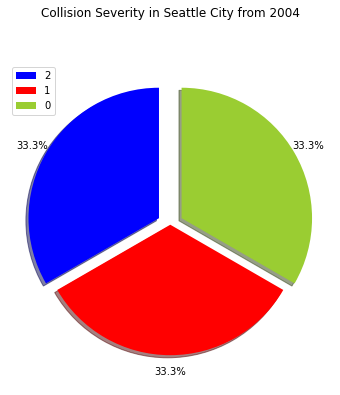

In [43]:
col_level = resampled_df.loc[:,['SEVERITYCODE']]
col_level = col_level['SEVERITYCODE'].value_counts().reset_index()
col_level.columns = ['SEVERITYCODE', 'Count']

colors_list = ['blue', 'red', 'yellowgreen']
explode_list = (0.1, 0, 0.1)

col_level['Count'].plot (kind = 'pie', figsize = (15, 6), autopct = '%1.1f%%', startangle = 90, shadow = True, labels = None, pctdistance = 1.12, colors = colors_list, explode = explode_list)

plt.title ('Collision Severity in Seattle City from 2004', y = 1.12) 
plt.ylabel(None)
plt.legend (labels = col_level['SEVERITYCODE'], loc = 'upper left') 

plt.show ()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning: FixedFormatter should only be used together with FixedLocator


[Text(0, 0.0, '0%'),
 Text(0, 0.2, '20%'),
 Text(0, 0.4, '40%'),
 Text(0, 0.6000000000000001, '60%'),
 Text(0, 0.8, '80%'),
 Text(0, 1.0, '100%'),
 Text(0, 1.2000000000000002, '120%')]

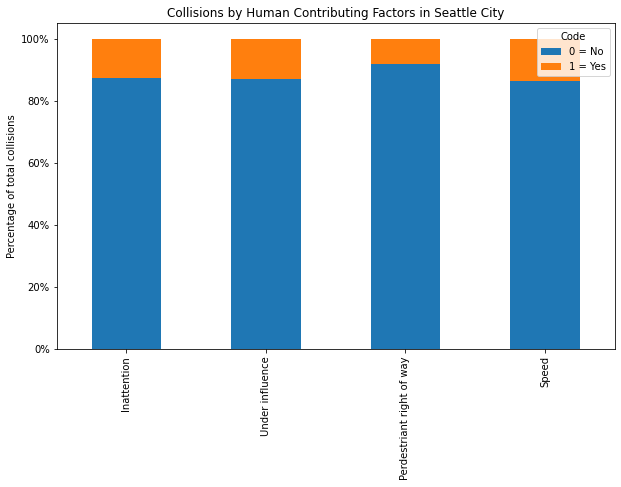

In [44]:
col_inattendtion = resampled_df.loc[:,['INATTENTIONIND']]
col_inattendtion = col_inattendtion.groupby(['INATTENTIONIND']).size().reset_index()
col_inattendtion.columns = ['INATTENTIONIND', 'Count']
col_inattendtion['Percentage'] = col_inattendtion['Count']/resampled_df.shape[0]

col_pedest = resampled_df.loc[:,['PEDROWNOTGRNT']]
col_pedest = col_pedest.groupby(['PEDROWNOTGRNT']).size().reset_index()
col_pedest.columns = ['PEDROWNOTGRNT', 'Count']
col_pedest['Percentage'] = col_pedest['Count']/resampled_df.shape[0]

col_speed = resampled_df.loc[:,['SPEEDING']]
col_speed = col_speed.groupby(['SPEEDING']).size().reset_index()
col_speed.columns = ['SPEEDING', 'Count']
col_speed['Percentage'] = col_speed['Count']/resampled_df.shape[0]

col_influence = resampled_df.loc[:,['UNDERINFL']]
col_influence = col_influence.groupby(['UNDERINFL']).size().reset_index()
col_influence.columns = ['UNDERINFL', 'Count']
col_influence['Percentage'] = col_influence['Count']/resampled_df.shape[0]

data = pd.DataFrame({'Code':['0 = No', '1 = Yes'],
                     'Inattention':col_inattendtion['Percentage'],
                     'Under influence': col_influence['Percentage'],
                     'Perdestriant right of way':col_pedest['Percentage'],
                     'Speed':col_speed['Percentage']})
data.set_index('Code', inplace = True)
chart = data.transpose()

ax15 = chart.plot (kind = 'bar', figsize = (10, 6), rot = 90, stacked = True)
ax15.set_title ('Collisions by Human Contributing Factors in Seattle City')
ax15.set_ylabel ('Percentage of total collisions')
ax15.set_yticklabels(['{:,.0%}'.format(x) for x in ax15.get_yticks()])

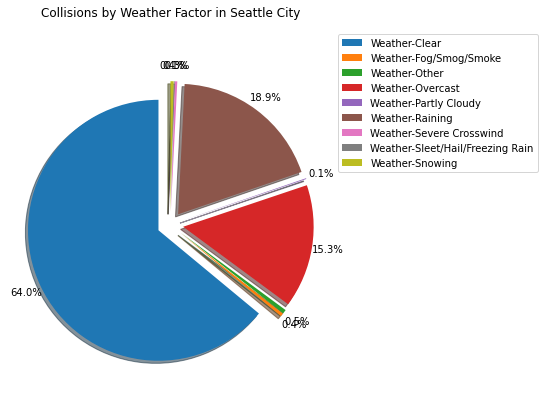

In [45]:
col_weather = resampled_df.loc[:,[col for col in resampled_df if col.startswith('Weather-')]]
col_weather = col_weather.sum(axis = 0).reset_index()
col_weather.columns = ['WEATHER', 'Count']
col_weather['Percentage'] = col_weather['Count']/resampled_df.shape[0]

explode_list = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1)

col_weather['Count'].plot (kind = 'pie', figsize = (15, 6), autopct = '%1.1f%%', startangle = 90, shadow = True, labels = None, pctdistance = 1.12, explode = explode_list)

plt.title ('Collisions by Weather Factor in Seattle City', y = 1.12) 
plt.ylabel(None)
plt.legend (labels = col_weather['WEATHER'], loc = 'upper left', bbox_to_anchor=(1,1.1)) 

plt.show ()

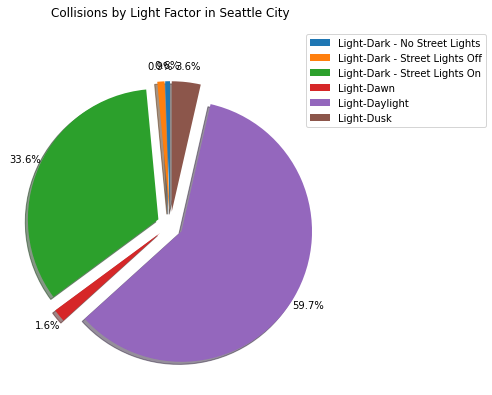

In [46]:
col_light = resampled_df.loc[:,[col for col in resampled_df if col.startswith('Light')]]
col_light = col_light.sum(axis = 0).reset_index()
col_light.columns = ['LIGHTCOND', 'Count']
col_light['Percentage'] = col_light['Count']/resampled_df.shape[0]

explode_list = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1)

col_light['Count'].plot (kind = 'pie', figsize = (15, 6), autopct = '%1.1f%%', startangle = 90, shadow = True, labels = None, pctdistance = 1.12, explode = explode_list)

plt.title ('Collisions by Light Factor in Seattle City', y = 1.12) 
plt.ylabel(None)
plt.legend (labels = col_light['LIGHTCOND'], loc = 'upper left', bbox_to_anchor=(0.9,1.1)) 

plt.show ()

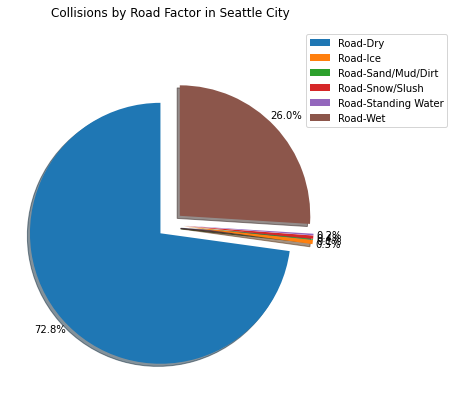

In [47]:
col_road = resampled_df.loc[:,[col for col in resampled_df if col.startswith('Road')]]
col_road = col_road.sum(axis = 0).reset_index()
col_road.columns = ['ROADCOND', 'Count']
col_road['Percentage'] = col_road['Count']/resampled_df.shape[0]

explode_list = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1)

col_road['Count'].plot (kind = 'pie', figsize = (15, 6), autopct = '%1.1f%%', startangle = 90, shadow = True, labels = None, pctdistance = 1.12, explode = explode_list)

plt.title ('Collisions by Road Factor in Seattle City', y = 1.12) 
plt.ylabel(None)
plt.legend (labels = col_road['ROADCOND'], loc = 'upper left', bbox_to_anchor=(0.9,1.1)) 

plt.show ()

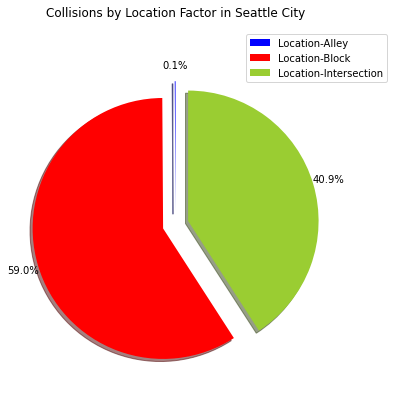

In [48]:
col_location = resampled_df.loc[:,['Location-Alley', 'Location-Block', 'Location-Intersection']]
col_location = col_location.sum(axis = 0).reset_index()
col_location.columns = ['LOCATION', 'Count']

colors_list = ['blue', 'red', 'yellowgreen']
explode_list = (0.1, 0.1, 0.1)

col_location['Count'].plot (kind = 'pie', figsize = (15, 6), autopct = '%1.1f%%', startangle = 90, shadow = True, labels = None, pctdistance = 1.12, colors = colors_list, explode = explode_list)

plt.title ('Collisions by Location Factor in Seattle City', y = 1.12) 
plt.ylabel(None)
plt.legend (labels = col_location['LOCATION'], loc = 'upper left', bbox_to_anchor=(0.7,1.1)) 

plt.show ()

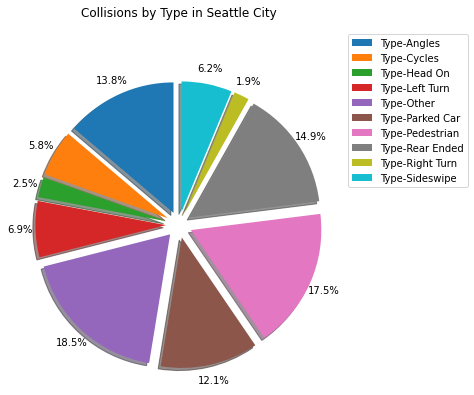

In [49]:
col_type = resampled_df.loc[:,['Type-Angles', 'Type-Cycles', 'Type-Head On', 'Type-Left Turn', 'Type-Other', 'Type-Parked Car', 'Type-Pedestrian', 'Type-Rear Ended', 'Type-Right Turn', 'Type-Sideswipe']]
col_type = col_type.sum(axis = 0).reset_index()
col_type.columns = ['TYPE', 'Count']

explode_list = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1)

col_type['Count'].plot (kind = 'pie', figsize = (15, 6), autopct = '%1.1f%%', startangle = 90, shadow = True, labels = None, pctdistance = 1.12, explode = explode_list)

plt.title ('Collisions by Type in Seattle City', y = 1.12) 
plt.ylabel(None)
plt.legend (labels = col_type['TYPE'], loc = 'upper right', bbox_to_anchor=(1.4,1.1)) 

plt.show ()

<a id="heading--2-2-6"></a>
### **Normalizing Data**   
Having a cleaned and balanced dataset, we separate the independent variables to feature set X and dependent variable `SEVERITYCOD` to set Y. We use StandardScaler package from Scikit Learn to standardise the feature set. This package recasts each feature in the feature set having distribution with zero mean and unit variance. It helps to ensure that all features are on a similar scale and the model will not be biased towards or away from certain features due to the range numerical values assigned to those features.

In [50]:
X = resampled_df[resampled_df.columns.difference(['SEVERITYCODE'])]
X = preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  


array([[-0.38138504, -0.07738232, -0.0949158 , -0.71184721, -0.12700013,
         0.82122993, -0.19245009, -0.03151267, -1.20028245,  1.20274766,
        -0.29559878,  0.61098036, -0.07060485, -0.03151267, -0.06311944,
        -0.0445878 , -0.59262672, -0.39659863, -0.39994246, -0.24708831,
        -0.15947523,  3.66060104, -0.47568621, -0.37107616, -0.45993311,
        -0.41812101, -0.13860492, -0.25819889, -0.38818157,  0.75019377,
        -0.06311944, -0.07060485, -0.42465029, -0.03151267, -0.48351022,
        -0.05463584, -0.03151267, -0.06311944],
       [-0.38138504, -0.07738232, -0.0949158 , -0.71184721, -0.12700013,
         0.82122993, -0.19245009, -0.03151267,  0.83313723, -0.83142959,
        -0.29559878, -1.63671382, -0.07060485, -0.03151267, -0.06311944,
        -0.0445878 ,  1.68740281, -0.39659863, -0.39994246, -0.24708831,
        -0.15947523, -0.27317918, -0.47568621, -0.37107616, -0.45993311,
         2.39165215, -0.13860492, -0.25819889, -0.38818157, -1.33298894,
   

In [51]:
Y = resampled_df['SEVERITYCODE'].values
Y[0:5]

array([0, 0, 0, 0, 0])

<a id="heading--2-2-7"></a>
### **Creating the Training and Testing subsets**   
After the data wrangling, we split the dataset into training and testing subsets, which are mutually exclusive, as training and testing on the same dataset will most likely have low out-of-sample accuracy due to the likelihood of the model being over-fit. It is important for the model to have a high out-of-sample accuracy, because the purpose is to make correct predictions on new unknown data. The split is performed using the following ratio:
+ 70% for training to build an accurate model, and
+ 30% for testing to report the accuracy of the model.


In [52]:
X_train, X_test, Y_train, Y_test = train_test_split (X, Y, test_size = 0.3, random_state = 4)
print ('Train set:', X_train.shape,  Y_train.shape)
print ('Test set:', X_test.shape,  Y_test.shape)

Train set: (705, 38) (705,)
Test set: (303, 38) (303,)


<a id="heading--3"></a>
# **III. Collision Severity Model**

<a id="heading--3-1"></a>
## **1. Machine Learning Algorithm Selection**  

The following algorithms are used for model development:

+ **K Nearest Neighbor (KNN)**: This is a classification algorithm that takes a bunch of labelled data points and uses them to learn how to label other points, based on their similarity to other cases. Similar cases with the same class labels are near each other, and the distance between two data points can be calculated using Euclidean distance. Once a new point is to be predicted, it takes into account the 'K' nearest points to it to determine its classification.

+ **Decision Tree**: This is another classification algorithm that breaks down a dataset into smaller subsets to incrementally develop a decision tree. It tests an attribute and branching the data points based on the result of the test. So, a decision tree includes internal nodes each corresponding to a test, each branch in an internal node corresponding to a result of the test, and each leaf node in a branch assigning a data point to a class.

+ **Support Vector Machine**: This works by mapping data to a high-dimensional feature space (also known as kernelling) so that data points can be categorized. A separator between the categories is estimated, then the data is transformed in such a way that the separator could be drawn as a hyperplane. Following this, characteristics of new unknown data can be used to predict the group to which it should belong.

+ **Logistic Regression**: This is a statistical and machine learning technique that, in its basic form, produces a formula to predict the probability of the class label regarding the dependent variable Y as a logistic function of the independent variables Xs. It is useful when variable Y is categorical, as Linear regression is more suited for estimating continuous values.     
     
The model performance is evaluated using the accuracy measurements, such as: 
+ **Jaccard index**: This is calculated using jaccard_similarity_score function (accuracy classification score function would provide the same result), to show how closely the actual labels and predicted labels are matched in the test set. It is the size of the intersection divided by the size of the union of two label sets Y and $\hat{Y}$, where Y is the true label based on the testing data and $\hat{Y}$ is the predicted label using the model.
+ **F1-score**: This is the harmonic average of the precision and recall of the model, where an F1 score reaches its best value at 1 (perfect precision and recall) and worst at 0 (if either the precision or the recall is 0). The precision is the number of correctly identified positive results divided by the number of all positive results, including those not identified correctly. The recall is the number of correctly identified positive results divided by the number of all samples that should have been identified as positive.
+ **Log loss**: This is accuracy measurement for Logistic regression, where the predicted output is probability value between 0 and 1 of a class label, instead of the label. A model with a lower log loss would have a better accuracy. 

<a id="heading--3-2"></a>
## **2. Model Development**  

<a id="heading--3-2-1"></a>
### **K Nearest Neighbor (KNN)**  
K in KNN is the number of nearest neighbors to examine. The optimal choice of K is highly dependent on the dataset and is important for the model performance.	a low value of K can cause an overly complex model, which might result in overfitting of model i.e. the prediction process is not generalized enough to be used for out-of-sample cases. On the other hand, a high value of K can cause an overly generalized model. To choose the right value for K, we perform several iterations with different values of K. Each iteration involves using the training set for modeling and calculating the accuracy of prediction using the testing set. The KNN model is built using the KNeighborsClassifier package in Scikit Learn with parameter n_neighbors = K. Aside from updating K after each iteration, all other parameters in the model are kept at default. It turns out the best K = 58 which provides the best accuracy of 0.65. So, K = 58 will be used to train our model for collision severity that later predicts the testing set.

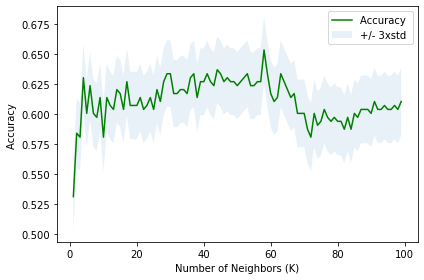

The best accuracy was with 0.6534653465346535 with k =  58


In [53]:
# Find the best K for the model
# Calculate the accuracy of KNN for 50 different Ks.
Ks = 100
mean_acc_KNN = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];

for n in range (1, Ks):
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train, Y_train)
    Yhat = neigh.predict(X_test)
    mean_acc_KNN[n-1] = metrics.accuracy_score(Y_test, Yhat)
    std_acc[n-1] = np.std(Yhat == Y_test) / np.sqrt(Yhat.shape[0])

# Plot model accuracy for different number of neighbours
plt.plot (range(1, Ks), mean_acc_KNN, 'g')
plt.fill_between (range(1, Ks), mean_acc_KNN - 1 * std_acc,mean_acc_KNN + 1 * std_acc, alpha = 0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

# Print the result of the best K
print("The best accuracy was with", mean_acc_KNN.max (), "with k = ", mean_acc_KNN.argmax () + 1)

In [54]:
# Train the model with the training set and k = 83
K = mean_acc_KNN.argmax () + 1
neigh = KNeighborsClassifier(n_neighbors = K).fit(X_train, Y_train)

# Predicted Y_test
Yhat_KNN = neigh.predict(X_test)

<a id="heading--3-2-2"></a>
### **Decision Tree**  
The objective is to first find an attribute from the dataset that is most predictive in splitting data within the training set, based on the values of that attribute. Then in each branch, the process is repeated using other attributes to split the sub-trees, until all the leaf nodes are pure. The impurity of the nodes is calculated by entropy which is the amount of information disorder. A node is considered pure if in all cases they fall into a specific category of target variable, the severity code. The decision tree model is built using the DecisionTreeClassifier package in Scikit Learn, with criterion 'entropy'. It can be seen that the tree requires 19 layers of branching depth to achieve leaf node purity, and `WEATHER` is the most predictive attribute as being the initial branching level.

In [55]:
# Set up the Decision Tree, using the training set
collisiontree = DecisionTreeClassifier(criterion = "entropy")
collisiontree.fit(X_train, Y_train)

# Predicted Y_test
Yhat_DT = collisiontree.predict(X_test)

print('DecisionTreeClassifier max_depth: {}'.format(collisiontree.tree_.max_depth))

DecisionTreeClassifier max_depth: 19


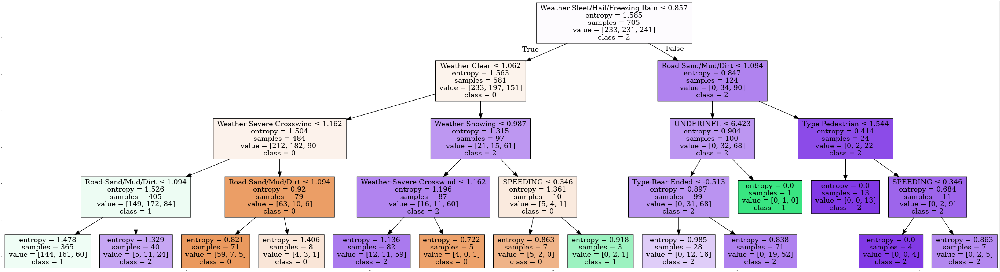

In [56]:
# Plot the decision tree
collisiontree1 = DecisionTreeClassifier(criterion = "entropy", max_depth = 4).fit(X_train, Y_train)
dot_data = StringIO()
filename = 'collisiontree.png'
featureNames = resampled_df.columns[1:39]
targetNames = [str(x) for x in resampled_df["SEVERITYCODE"].unique().tolist()]
out = tree.export_graphviz(collisiontree1, feature_names = featureNames, out_file = dot_data, class_names = targetNames, filled = True, special_characters = True, rotate = False)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize = (200, 300))
plt.imshow(img,interpolation='nearest')

<a id="heading--3-2-3"></a>
### **Support Vector Machine (SVM)**  
The kernel function used for the transformation can be of different types, such as:
+ Linear
+ Polynomial
+ Radial basis function (RBF)
+ Sigmoid

To choose the kernel function for SVM model, we perform several iterations with different function. Each iteration involves using the training set for modeling and calculating the accuracy of prediction using the testing set. The SVM model is built using the SVM package in Scikit Learn. Aside from updating parameter kernel after each iteration, all other parameters in the model are kept at default. It turns out the best kernel function is linear function which provides the best accuracy of 0.65. So, kernel = 'linear' will be used to train our model for collision severity that later predicts the testing set.

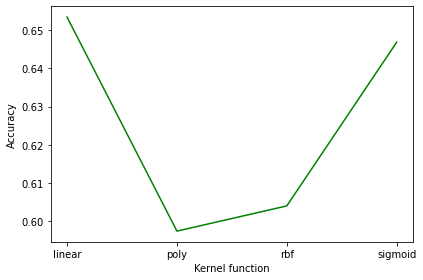

,Accuracy
Kernel function,
linear,0.653465
poly,0.597360
rbf,0.603960
sigmoid,0.646865


In [57]:
# Find the best kernel function for the transformation
# Calculate the accuracy of SVM for different kernel function
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
mean_acc_SVM = []

for s in kernels:
    clf = svm.SVC(kernel = s, gamma = 'scale').fit(X_train, Y_train)
    Yhat = clf.predict(X_test)
    mean_acc_SVM.append(metrics.accuracy_score(Y_test, Yhat))

# Plot model accuracy for different kernel functions
plt.plot (kernels, mean_acc_SVM, 'g')
plt.ylabel('Accuracy')
plt.xlabel('Kernel function')
plt.tight_layout()
plt.show()

# Print the result of accuracy
result = pd.DataFrame({'Kernel function':kernels, 'Accuracy':mean_acc_SVM})
result.set_index('Kernel function', inplace = True)
result

In [58]:
# Train the model with the training set and kernel = 'rbf'
clf = svm.SVC(kernel = 'linear', gamma = 'scale')
clf.fit(X_train, Y_train)

# Predicted Y_test
Yhat_SVM = clf.predict(X_test)

<a id="heading--3-2-4"></a>
### **Logistic Regression**  
The SVM model is built using the LogisticRegression package in Scikit Learn. This function implements logistic regression and can use different numerical optimizers to find parameters, including ‘newton-cg’, ‘lbfgs’, ‘liblinear’, ‘sag’, ‘saga’ solvers. In order to choose the solver for SVM model, we perform several iterations with different function. Each iteration involves using the training set for modeling and calculating the accuracy of prediction using the testing set. Aside from updating parameter solver after each iteration, all other parameters in the model are kept at default. It turns out the best solver is liblinear which provides the best accuracy of 0.66. So, solver = 'liblinear' will be used to train our model for collision severity that later predicts the testing set. 

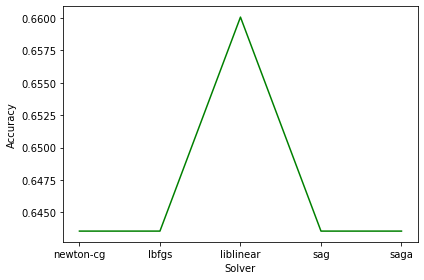

,Accuracy
Solver,
newton-cg,0.643564
lbfgs,0.643564
liblinear,0.660066
sag,0.643564
saga,0.643564


In [59]:
# Find the best solver for the model
# Calculate the accuracy of Logistic Regression for different solver
solvers = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
mean_acc_LR = []

for l in solvers:
    LR = LogisticRegression(C = 0.01, solver = l, multi_class = 'auto').fit (X_train, Y_train)
    Yhat = LR.predict(X_test)
    mean_acc_LR.append(metrics.accuracy_score(Y_test, Yhat))

# Plot model accuracy for different solvers
plt.plot (solvers, mean_acc_LR, 'g')
plt.ylabel('Accuracy')
plt.xlabel('Solver')
plt.tight_layout()
plt.show()

# Print the result of accuracy
result = pd.DataFrame({'Solver':solvers, 'Accuracy':mean_acc_LR})
result.set_index('Solver', inplace = True)
result

In [60]:
# Model logistic regression using the training test
LR = LogisticRegression(C = 0.01, solver = 'liblinear', multi_class = 'auto')
LR.fit(X_train, Y_train)

# Predicted Y_test
Yhat_LR = LR.predict(X_test)
Yhat_LR_prob = LR.predict_proba(X_test) 

<a id="heading--3-3"></a>
## **3. Model Evaluation**  

In [61]:
# Classification evaluation metrics

# For KNN model
Jaccard_KNN = jaccard_similarity_score (Y_test, Yhat_KNN).round(2)
F1_KNN = f1_score (Y_test, Yhat_KNN, average = 'weighted').round(2)

# For Decision Tree
Jaccard_DT = jaccard_similarity_score (Y_test, Yhat_DT).round(2)
F1_DT = f1_score (Y_test, Yhat_DT, average = 'weighted').round(2)

# For SVM model
Jaccard_SVM = jaccard_similarity_score (Y_test, Yhat_SVM).round(2)
F1_SVM = f1_score (Y_test, Yhat_SVM, average = 'weighted').round(2)

# For Logistic Regression model
Jaccard_LR = jaccard_similarity_score (Y_test, Yhat_LR).round(2)
F1_LR = f1_score (Y_test, Yhat_LR, average = 'weighted').round(2)
Logloss_LR = log_loss(Y_test, Yhat_LR_prob).round(2)

In [62]:
Dict = {'Algorithm':['KNN','Decision Tree','SVM','Logistic Regression'],
        'Jaccard':[Jaccard_KNN,Jaccard_DT,Jaccard_SVM,Jaccard_LR],
        'F1-score':[F1_KNN,F1_DT,F1_SVM,F1_LR],
        'LogLoss':['NA','NA','NA',Logloss_LR]}

report = pd.DataFrame(Dict)
report

,Algorithm,Jaccard,F1-score,LogLoss
0,KNN,0.65,0.65,NA
1,Decision Tree,0.62,0.62,NA
2,SVM,0.65,0.65,NA
3,Logistic Regression,0.66,0.65,0.87


In [63]:
def plot_confusion_matrix (cm, classes, normalize = False, title = 'Confusion matrix', cmap = plt.cm.Blues):
    if normalize:
        cm = cm.astype ('float') / cm.sum (axis = 1) [:, np.newaxis]
        print ('Normalized confusion matrix')
    else:
        print ('Confusion matrix, without normalization')

    print (cm)
    plt.imshow (cm, interpolation = 'nearest', cmap = cmap)
    plt.title (title)
    plt.colorbar ()
    tick_marks = np.arange(len (classes))
    plt.xticks (tick_marks, classes, rotation = 45)
    plt.yticks (tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text (j, i, format (cm[i, j], fmt), horizontalalignment = "center", color = "white" if cm [i, j] > thresh else "black")

    plt.tight_layout ()
    plt.ylabel ('True label')
    plt.xlabel ('Predicted label')

Confusion matrix, without normalization
[[75 19  1]
 [20 70 15]
 [12 38 53]]
              precision    recall  f1-score   support

           0       0.77      0.51      0.62       103
           1       0.55      0.67      0.60       105
           2       0.70      0.79      0.74        95

   micro avg       0.65      0.65      0.65       303
   macro avg       0.67      0.66      0.65       303
weighted avg       0.67      0.65      0.65       303



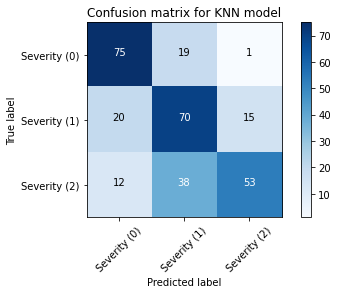

In [64]:
# Confusion matrix for KNN model
cnf_matrix_KNN = confusion_matrix (Y_test, Yhat_KNN, labels = [2,1,0])
np.set_printoptions (precision = 2)

plt.figure ()
plot_confusion_matrix (cnf_matrix_KNN, classes = ['Severity (0)', 'Severity (1)', 'Severity (2)'], normalize = False, title = 'Confusion matrix for KNN model')
print(classification_report(Y_test, Yhat_KNN))

Confusion matrix, without normalization
[[67 20  8]
 [18 57 30]
 [10 29 64]]
              precision    recall  f1-score   support

           0       0.63      0.62      0.62       103
           1       0.54      0.54      0.54       105
           2       0.71      0.71      0.71        95

   micro avg       0.62      0.62      0.62       303
   macro avg       0.62      0.62      0.62       303
weighted avg       0.62      0.62      0.62       303



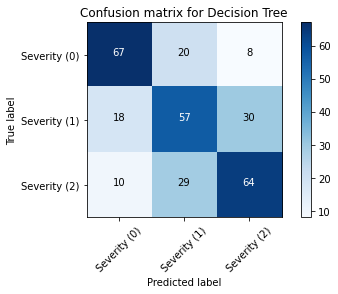

In [65]:
# Confusion matrix for Decision Tree
cnf_matrix_DT = confusion_matrix (Y_test, Yhat_DT, labels = [2,1,0])
np.set_printoptions (precision = 2)

plt.figure ()
plot_confusion_matrix (cnf_matrix_DT, classes = ['Severity (0)', 'Severity (1)', 'Severity (2)'], normalize = False, title = 'Confusion matrix for Decision Tree')
print(classification_report(Y_test, Yhat_DT))

Confusion matrix, without normalization
[[70 25  0]
 [17 76 12]
 [ 9 42 52]]
              precision    recall  f1-score   support

           0       0.81      0.50      0.62       103
           1       0.53      0.72      0.61       105
           2       0.73      0.74      0.73        95

   micro avg       0.65      0.65      0.65       303
   macro avg       0.69      0.66      0.66       303
weighted avg       0.69      0.65      0.65       303



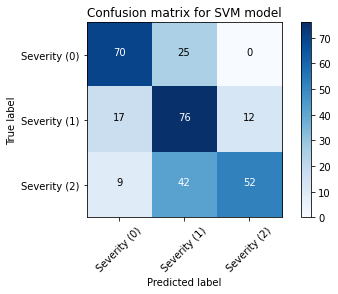

In [66]:
# Confusion matrix for SVM model
cnf_matrix_SVM = confusion_matrix (Y_test, Yhat_SVM, labels = [2,1,0])
np.set_printoptions (precision = 2)

plt.figure ()
plot_confusion_matrix (cnf_matrix_SVM, classes = ['Severity (0)', 'Severity (1)', 'Severity (2)'], normalize = False, title = 'Confusion matrix for SVM model')
print(classification_report(Y_test, Yhat_SVM))

Confusion matrix, without normalization
[[84  8  3]
 [23 57 25]
 [14 30 59]]
              precision    recall  f1-score   support

           0       0.68      0.57      0.62       103
           1       0.60      0.54      0.57       105
           2       0.69      0.88      0.78        95

   micro avg       0.66      0.66      0.66       303
   macro avg       0.66      0.67      0.66       303
weighted avg       0.66      0.66      0.65       303



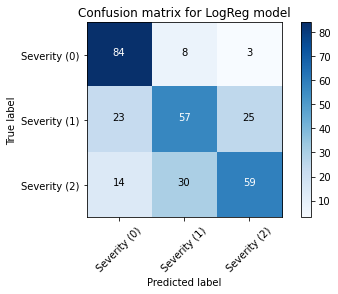

In [67]:
# Confusion matrix for Logistic Regression model
cnf_matrix_LR = confusion_matrix (Y_test, Yhat_LR, labels = [2,1,0])
np.set_printoptions (precision = 2)

plt.figure ()
plot_confusion_matrix (cnf_matrix_LR, classes = ['Severity (0)', 'Severity (1)', 'Severity (2)'], normalize = False, title = 'Confusion matrix for LogReg model')
print(classification_report(Y_test, Yhat_LR))